<a href="https://colab.research.google.com/github/DSWoodin/Practice/blob/main/PKNU_5th/02_ML/06_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### 강의 분량
* 07월16일(화) 8시간

### 강의 자료
* (수정)파이썬머신러닝_05회귀.ipynb

### 이 장에서 배우는 것

* 회귀 개요
* 릿지 회귀 Ridge(), SGDRegressor()에 penalty=L2
* 릿지 회귀에서 알파값 조절 alphas
* 라쏘 회귀 Lasso()
* 경사하강법를 사용해 Lasso 및 Ridge 회귀 모델의 최적화 경로 시각화
* 엘라스틱 넷 ElasticNet()
* 단순 선형 회귀를 통한 회귀 이해, 비용 함수와 RSS
* 비용 최소화 -> 경사 하강법(Gradient Descent) 개요
* 경사 하강법 함수 구현
* 미니 배치 확률적 경사 하강법 구현 3시간 3분
* 사이킷런 LinearRegression을 이용한 보스턴 주택 가격 예측
* 각 독립변수별 종속변수에 미치는 영향도 확인 seaborn.regplot 으로 회귀 직선과 산점도 동시에
* 데이터 전처리 후 학습/테스트 데이터 분리 학습/예측/평가
* 독립변수별 회귀 계수 확인
* 교차 검증 cross_val_score()으로 MSE와 RMSE 측정
* 다항 회귀 PolynomialFeatures 클래스로 단항값을 다항값으로 변경
* 사이킷런 파이프라인(Pipeline)으로 3차 다항회귀 학습
* 과소적합(Underfitting) 및 과적합(Overfitting) 이해
* 편향-분산 트레이드오프
* 규제 선형 모델 -> 릿지, 라쏘, 엘라스틱넷
* 릿지, 라쏘, 엘라스틱 회귀에서 alpha값을 변경시키며 RMSE 측정, 회귀계수 값 시각화
* 데이터 셋에 스케일링/정규화 작업 -> 표준정규화, 다항특성 변환, 로그 변환
* 로지스틱 회귀 -> 회귀 모델이 아닌 분류 모델
* 회귀 트리 RandomForestRegressor(), feature_importances_
* 결정트리, GBM, XGBoost, LightGBM 회귀 모델 비교, 회귀선 시각화
* 회귀 실습 - 자전거 대여 수요 예측
* 데이터 클렌징/가공 ->로그 변환, 피쳐 인코딩, 모델 학습/예측/평가
* 예측 성능 저하 원인 파악 -> 종속변수의 분포 확인(정규분포에 가까우면 좋음)
* 종속변수 분포 변환
* 예측 성능 저하 원인 파악 -> 각 독립변수의 회귀 계수값 파악(영향도가 높은 변수 확인)
* 카데고리형 피쳐 원-핫 인코딩
* 회귀 실습 - 캐글 주택 가격: 고급 회귀 기법
* 데이터 전처리, 종속변수의 분포 확인, 피처 원핫인코딩
* 고급 회귀 모델(릿지,라쏘) 학습/예측/평가, 회귀계수확인, 교차 검증
* 하이퍼 파라미터 튜닝
* 추출 왜곡 정도가 높은 피처 확인 -> Scipy의 skew -> 로그 변환, 이상치 제거
* 회귀 트리 학습/예측/평가 -> XGBRegressor(), LGBMRegressor()
* 릿지 + 라쏘 모델 예측 결과 혼합을 통한 최종 예측
* XGBoost + LightGBM 혼합 예측
* 스태킹 모델을 통한 회귀 예측


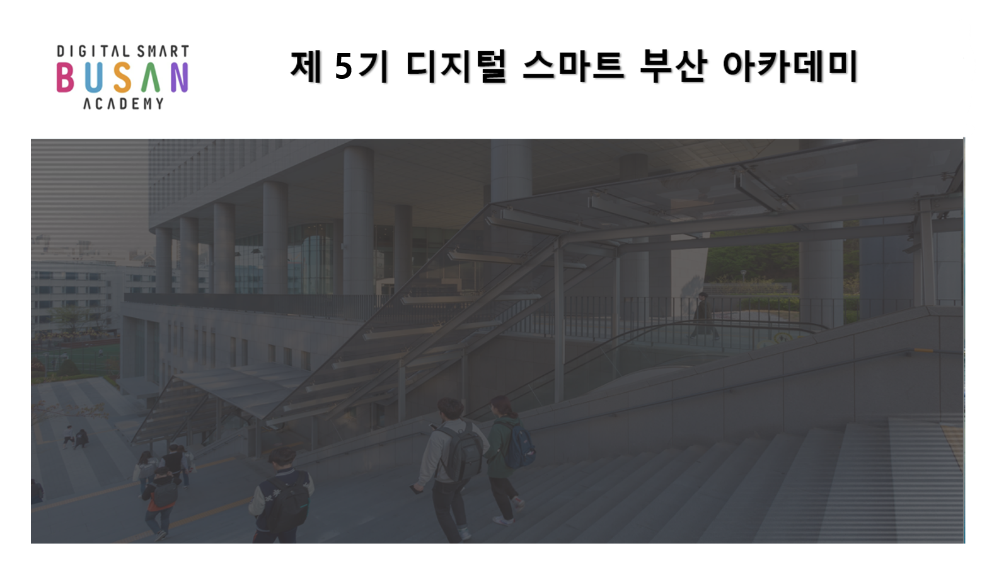

# **5장 회귀**

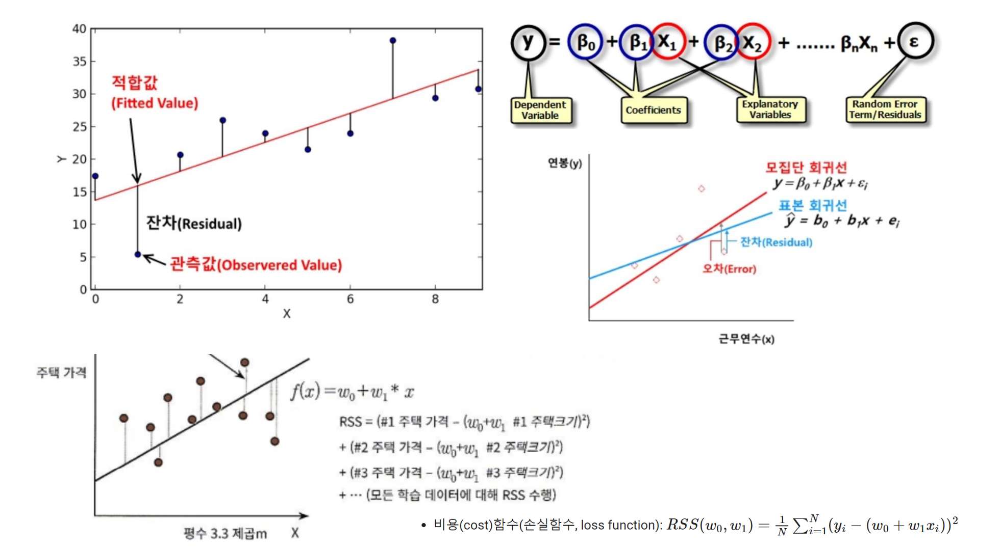

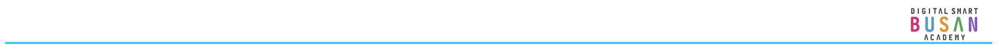

## 5.1 회귀 소개
* 선형회귀식: $Y=W_1X_1+W_2X_2+\cdots+W_nX_n$
  * $Y$: 종속변수(예, 아파트 가격)
  * $X_1, X_2, \cdots, X_n$: 독립변수(예, 방 개수, 방 크기, 주변 학군 등)
  * $W_1, W_2, \cdots, W_n$: 회귀 계수
* 머신러닝 회귀 예측의 핵심은 주어진 피처(feature, 독립변수)와 결정 값(taget value, 종속변수) 데이터 기반에서 학습을 통해 최적의 회귀 계수를 찾아내는 것


**<회귀 유형 구분>**

|독립변수 개수|회귀 계수의 결합|
|-----|-----|
|1개 단일 회귀|선형: 선형 회귀|
|여러개 다중 회귀|비선형: 비선형 회귀|  

**<분류와 회귀의 예측 결괏값 차이>**

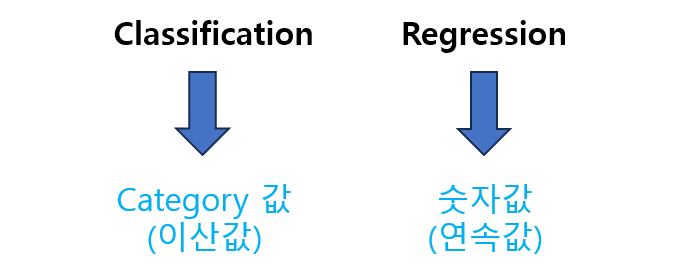

* 대표적인 선형 회귀 모델
  * 일반 선형 회귀: 예측값과 실제값의 RSS(Residual Sum of Squares)를 최소화할 수 있도록 회귀 계수를 최적화하여, 규제(Regularization)를 적용하지 않은 모델
  * 릿지(Redge): 릿지 회귀는 선형 회귀에 L2 규제를 추가한 회귀 모델
    * L2 규제: 상대적으로 큰 회귀 계수 값의 예측 영향도를 감소시키기 위해서 회귀 계수값을 더 작게 만드는 규제 모델
  * 라쏘(Lasso): 라쏘 회귀는 선형 회귀에 L1 규제를 적용한 방식
    * L1 규제: 예측 영향력이 적은 피처의 회귀 계수를 0으로 만들어 회귀 예측 시 피처가 선택되지 않게 하는 것(피처 선택 기능)
  * 엘라스틱넷(ElasticNet): L1, L2 규제를 함께 결합한 모델
    * 주로 피처가 많은 데이터 세트에 적용
    * L1 규제로 피처의 개수를 줄임과 동시에 L2 규제로 계수 값의 크기를 조정함
  * 로지스틱 회귀(Logistic Regression): 분류에 사용되는 선형 모델
    * 이진 분류뿐만 아니라 희소 영역의 분류
    * 텍스트 분류와 같은 영역에서 뛰어난 예측 성능을 보임   

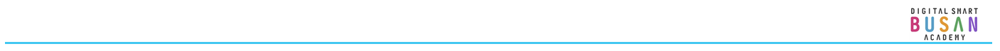

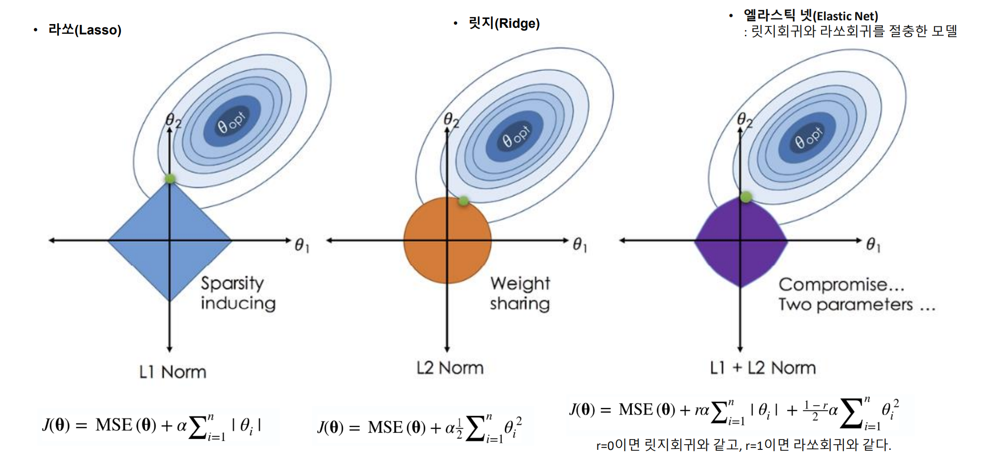

# 1. 릿지 회귀(Ridge Regression)
* 통계학에서 능형회귀라고 부르는데, 선형회귀에 규제가 추가된 것으로 비용함수에 $\alpha \sum^n_{i=1} \theta^2_i$ 항이 추가(L2 규제)

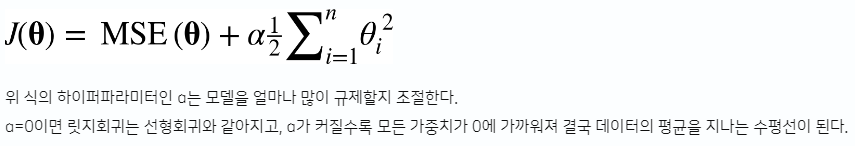

* 선형 데이터 셋에 정규방정식을 사용하여 릿지모델을 훈련

In [ ]:
import numpy as np

np.random.seed(42)
m = 20   # 데이터 수
X = 3 * np.random.rand(m, 1)  # 0~1 난수*3
y = 1 + 0.5 * X + np.random.randn(m, 1) / 1.5   # 1차방정식 형태
X_new = np.linspace(0, 3, 100).reshape(100, 1)  # 0~3사이 100개
print(X)
print('-----------------------')
print(y)
print('-----------------------')
print(X_new)

[[1.12362036]
 [2.85214292]
 [2.19598183]
 [1.79597545]
 [0.46805592]
 [0.46798356]
 [0.17425084]
 [2.59852844]
 [1.80334504]
 [2.12421773]
 [0.06175348]
 [2.90972956]
 [2.49732792]
 [0.63701733]
 [0.5454749 ]
 [0.55021353]
 [0.91272673]
 [1.57426929]
 [1.29583506]
 [0.87368742]]
-----------------------
[[0.88658943]
 [2.63556968]
 [1.49264153]
 [0.95645193]
 [2.21112714]
 [1.08347425]
 [1.13214422]
 [1.34943209]
 [1.5387507 ]
 [2.13605726]
 [0.26354769]
 [2.70533012]
 [1.84823817]
 [1.12404617]
 [0.87159971]
 [2.50995889]
 [1.44736521]
 [1.08199403]
 [2.1962808 ]
 [0.62294794]]
-----------------------
[[0.        ]
 [0.03030303]
 [0.06060606]
 [0.09090909]
 [0.12121212]
 [0.15151515]
 [0.18181818]
 [0.21212121]
 [0.24242424]
 [0.27272727]
 [0.3030303 ]
 [0.33333333]
 [0.36363636]
 [0.39393939]
 [0.42424242]
 [0.45454545]
 [0.48484848]
 [0.51515152]
 [0.54545455]
 [0.57575758]
 [0.60606061]
 [0.63636364]
 [0.66666667]
 [0.6969697 ]
 [0.72727273]
 [0.75757576]
 [0.78787879]
 [0.81818182

In [ ]:
from sklearn.linear_model import Ridge

ridge_reg = Ridge(alpha=1,
                 solver="cholesky",
                 random_state=42)
ridge_reg.fit(X,y)
ridge_reg.predict([[1.5]])   # 새로운 샘플에 대한 예측

array([[1.55071465]])

* 경사하강법을 이용해 릿지모델을 훈련(확률적 평균경사하강법; solver="sag" 사용)

* [참고] Ridge 회귀에서 사용 가능한 Solver 종류
  * auto: 데이터셋과 문제의 크기에 따라 자동으로 적절한 solver를 선택합니다. 대부분의 경우 좋은 시작점이 됩니다.
  * svd: Singular Value Decomposition을 사용하여 문제를 해결합니다. 안정적이지만 큰 데이터셋에서는 느릴 수 있습니다.
  * cholesky: Cholesky 분해를 사용합니다. 양의 정부호 행렬일 때 효율적입니다.
  * lsqr: Conjugate Gradient method를 사용한 Least Squares Solver입니다. 큰 문제에 적합하며, sparse matrix에도 사용할 수 있습니다.
  * sparse_cg: Conjugate Gradient method를 사용한 Sparse Least Squares Solver입니다. sparse matrix에 특화되어 있습니다.
  * sag: Stochastic Average Gradient descent입니다. 큰 데이터셋에서 효율적이며, 특히 특징이 많은 경우에 유용합니다.
  * saga: SAGA solver는 SAG의 변형으로, L1 규제를 지원합니다.

In [ ]:
ridge_reg = Ridge(alpha=1, solver="sag", random_state=42)
ridge_reg.fit(X, y)
ridge_reg.predict([[1.5]])

array([[1.55072189]])

* [참고] sklearn.linear_model의 주요 모델 종류
  * Ordinary Least Squares (OLS): 가장 기본적인 선형 회귀 모델입니다.
  * Ridge Regression: L2 규제를 적용하여 과적합을 방지하는 선형 회귀 모델입니다.
  * Lasso Regression: L1 규제를 적용하여 특징 선택 효과를 가지는 선형 회귀 모델입니다.
  * Elastic Net: Ridge와 Lasso의 장점을 결합한 규제를 적용하는 선형 회귀 모델입니다.
  * Linear Regression: OLS와 유사하지만, 다양한 solver를 지원하고, intercept를 포함할지 여부를 설정할 수 있습니다.
  * Logistic Regression: 선형 모델을 이용하여 분류 문제를 해결하는 모델입니다.
  * LinearSVC: Linear Support Vector Classification의 약자로, 서포트 벡터 머신을 이용한 선형 분류 모델입니다.
  * Perceptron: 인공 신경망의 가장 기본적인 단위인 퍼셉트론을 이용한 분류 모델입니다.
  * SGDClassifier: Stochastic Gradient Descent를 이용한 분류 모델로, 다양한 손실 함수와 규제를 지원합니다.
  * SGDRegressor: Stochastic Gradient Descent를 이용한 회귀 모델입니다.

* penalty="l2”는 SGD(Stochastic Gradient Descent)가 비용함수에 가중치 벡터의 $\ell2$노름의 제곱을 2로 나눈 규제항을 추가하게 만든다(즉, 릿지 회귀).

In [ ]:
from sklearn.linear_model import SGDRegressor

sgd_reg = SGDRegressor(max_iter=5,
                       penalty="l2",
                       random_state=42)
sgd_reg.fit(X,y.ravel())
sgd_reg.predict([[1.5]])

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1561: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


array([1.13500145])

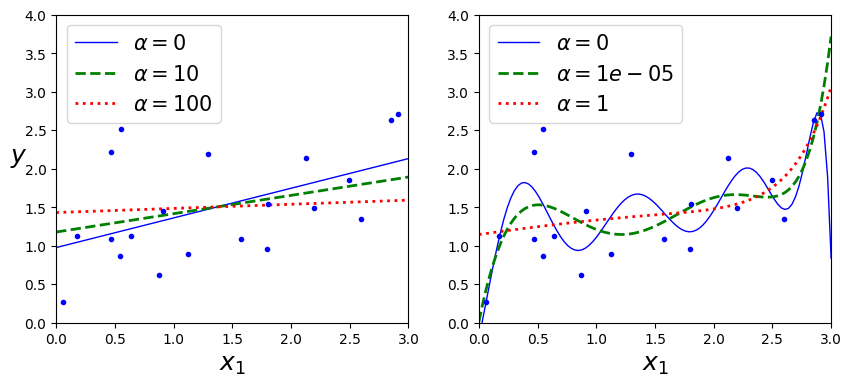

In [ ]:
# alphas 조절
from sklearn.linear_model import Ridge, LinearRegression
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler

def plot_model(model_class, polynomial, alphas, **model_kargs):
    for alpha, style in zip(alphas, ("b-", "g--", "r:")):
        model = model_class(alpha, **model_kargs) if alpha > 0 else LinearRegression()
        if polynomial:
            model = Pipeline([
                    ("poly_features", PolynomialFeatures(degree=10, include_bias=False)),
                    ("std_scaler", StandardScaler()),
                    ("regul_reg", model),
                ])
        model.fit(X, y)
        y_new_regul = model.predict(X_new)
        lw = 2 if alpha > 0 else 1
        plt.plot(X_new, y_new_regul, style, linewidth=lw, label=r"$\alpha = {}$".format(alpha))
    plt.plot(X, y, "b.", linewidth=3)
    plt.legend(loc="upper left", fontsize=15)
    plt.xlabel("$x_1$", fontsize=18)
    plt.axis([0, 3, 0, 4])

plt.figure(figsize=(10,4))
plt.subplot(121)
plot_model(Ridge, polynomial=False, alphas=(0, 10, 100), random_state=42)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.subplot(122)
plot_model(Ridge, polynomial=True, alphas=(0, 10**-5, 1), random_state=42)

plt.show()

* 각기다른 $\alpha$를 사용해 릿지모델을 훈련시킨 결과
  * 왼쪽: 평병한 릿지모델
  * 오른쪽: 다항회귀(PolynomialFeatures(degree=10))를 사용해 먼저 데이터를 확장하고 StandardScaler를 사용해 스케일 조정 후 릿지모델에 적용한 결과(규제를 사용한 다항회귀)

* $\alpha$를 증가시킬수록 직선에 가까워 지는 것을 알 수 있다(분산은 줄고 편향이 증가).

# 2. 라쏘 회귀(Lasso Regression)
* 릿지 회귀처럼 비용함수에 규제항을 더하지만 $\ell2$노름의 제곱을 2로 나눈 것 대신 가중치 벡터의  $\ell1$노름을 사용한다.

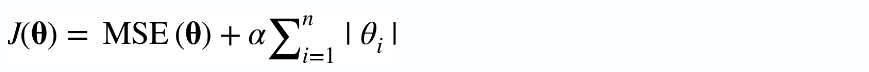

* 라쏘모델과 더 작은 $\alpha$를 사용한 결과

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.803e+00, tolerance: 9.295e-04
  model = cd_fast.enet_coordinate_descent(


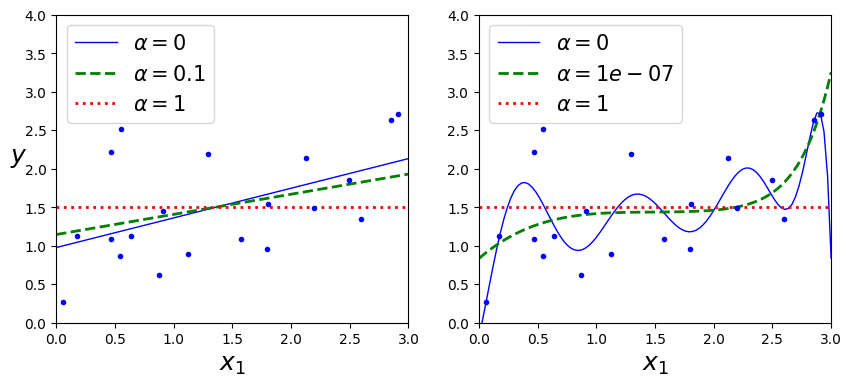

In [ ]:
from sklearn.linear_model import Lasso

plt.figure(figsize=(10,4))
plt.subplot(121)
plot_model(Lasso, polynomial=False, alphas=(0, 0.1, 1), random_state=42)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.subplot(122)
plot_model(Lasso, polynomial=True, alphas=(0, 10**-7, 1), random_state=42)

plt.show()

* 라쏘회귀의 중요한 특징은 덜 중요한 변수의 가중치를 완전히 제거하려고 한다는 점

* 위 그래프를 보면 다항회귀의 차수가 거의 0이 되어가는(직선이 되어가는) 것을 볼 수 있다.

* 즉, 라쏘회귀는 자동으로 변수를 선택하고 희소모델(sparse model)을 만든다(즉, 0이아닌 변수의 가중치가 적다).

*  다차원 방정식 $y = 2x_1 + 0.5x_2$로, 최적의 파라미터는 $\theta_1=2, \theta_2=0.5$

In [ ]:
t1a, t1b, t2a, t2b = -1, 3, -1.5, 1.5

t1s = np.linspace(t1a, t1b, 500)
t2s = np.linspace(t2a, t2b, 500)
t1, t2 = np.meshgrid(t1s, t2s)
T = np.c_[t1.ravel(), t2.ravel()]
Xr = np.array([[1, 1], [1, -1], [1, 0.5]])
yr = 2 * Xr[:, :1] + 0.5 * Xr[:, 1:]

J = (1/len(Xr) * np.sum((T.dot(Xr.T) - yr.T)**2, axis=1)).reshape(t1.shape)

N1 = np.linalg.norm(T, ord=1, axis=1).reshape(t1.shape)
N2 = np.linalg.norm(T, ord=2, axis=1).reshape(t1.shape)

t_min_idx = np.unravel_index(np.argmin(J), J.shape)
t1_min, t2_min = t1[t_min_idx], t2[t_min_idx]

t_init = np.array([[0.25], [-1]])

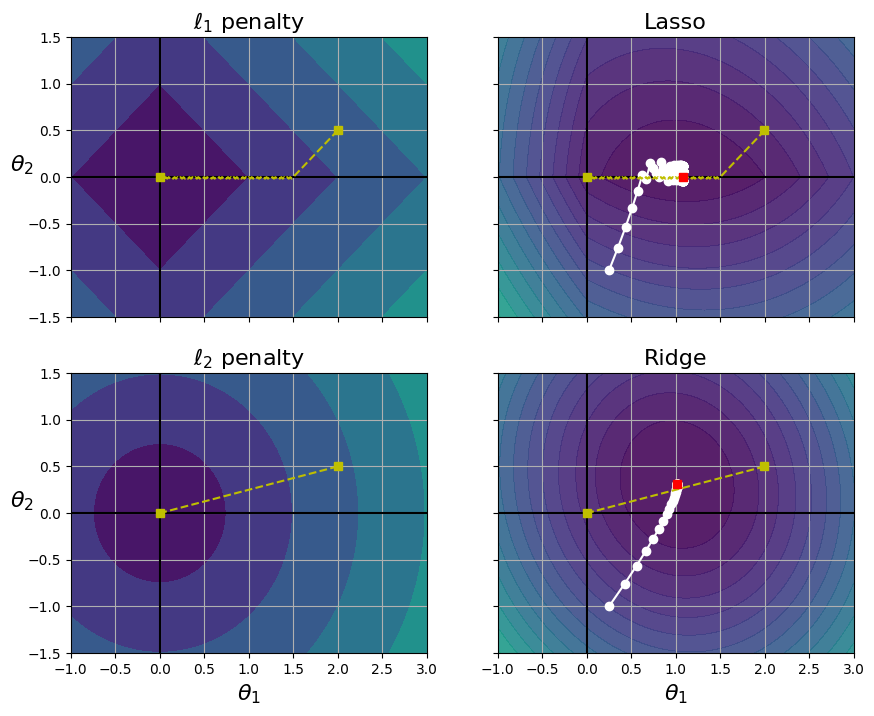

In [ ]:
def bgd_path(theta, X, y, l1, l2, core = 1, eta = 0.05, n_iterations = 200):
    path = [theta]
    for iteration in range(n_iterations):
        gradients = core * 2/len(X) * X.T.dot(X.dot(theta) - y) + l1 * np.sign(theta) + l2 * theta
        theta = theta - eta * gradients
        path.append(theta)
    return np.array(path)

fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10.1, 8))
for i, N, l1, l2, title in ((0, N1, 2., 0, "Lasso"), (1, N2, 0,  2., "Ridge")):
    JR = J + l1 * N1 + l2 * 0.5 * N2**2

    tr_min_idx = np.unravel_index(np.argmin(JR), JR.shape)
    t1r_min, t2r_min = t1[tr_min_idx], t2[tr_min_idx]

    levelsJ=(np.exp(np.linspace(0, 1, 20)) - 1) * (np.max(J) - np.min(J)) + np.min(J)
    levelsJR=(np.exp(np.linspace(0, 1, 20)) - 1) * (np.max(JR) - np.min(JR)) + np.min(JR)
    levelsN=np.linspace(0, np.max(N), 10)

    path_J = bgd_path(t_init, Xr, yr, l1=0, l2=0)
    path_JR = bgd_path(t_init, Xr, yr, l1, l2)
    path_N = bgd_path(np.array([[2.0], [0.5]]), Xr, yr, np.sign(l1)/3, np.sign(l2), core=0)

    ax = axes[i, 0]
    ax.grid(True)
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')
    ax.contourf(t1, t2, N / 2., levels=levelsN)
    ax.plot(path_N[:, 0], path_N[:, 1], "y--")
    ax.plot(0, 0, "ys")
    ax.plot(t1_min, t2_min, "ys")
    ax.set_title(r"$\ell_{}$ penalty".format(i + 1), fontsize=16)
    ax.axis([t1a, t1b, t2a, t2b])
    if i == 1:
        ax.set_xlabel(r"$\theta_1$", fontsize=16)
    ax.set_ylabel(r"$\theta_2$", fontsize=16, rotation=0)

    ax = axes[i, 1]
    ax.grid(True)
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')
    ax.contourf(t1, t2, JR, levels=levelsJR, alpha=0.9)
    ax.plot(path_JR[:, 0], path_JR[:, 1], "w-o")
    ax.plot(path_N[:, 0], path_N[:, 1], "y--")
    ax.plot(0, 0, "ys")
    ax.plot(t1_min, t2_min, "ys")
    ax.plot(t1r_min, t2r_min, "rs")
    ax.set_title(title, fontsize=16)
    ax.axis([t1a, t1b, t2a, t2b])
    if i == 1:
        ax.set_xlabel(r"$\theta_1$", fontsize=16)

plt.show()

* MSE 비용함수는 동일하지만, $\ell1, \ell2$ 페널티 그래프에 있는 등고선은 다르다(왼쪽 열).
* 오른쪽 열은 비용함수에 규제항이 포함되어 있어서(라쏘와 릿지) 등고선이 다르게 나타나며초 최적 파라미터 값(빨간 네모)이 달라진 것을 볼 수 있다.

* 라쏘 비용함수에서 배치 경사하강법의 경로가 전역 최솟값(빨간 네모)으로 가는 도중에 지그재그로 튀는 경향을 보이는데, 이는 θ2=0에서 기울기가 갑자기 바뀌기 때문이다.

* 사이킷런의 Lasso모듈을 사용한 예제


In [ ]:
from sklearn.linear_model import Lasso

lasso_reg = Lasso(alpha = 0.1)
lasso_reg.fit(X,y)
lasso_reg.predict([[1.5]])

array([1.53788174])

# 3. 엘라스틱 넷(Elastic Net)
* 릿지회귀와 라쏘회귀를 절충한 모델이다.

* 규제항은 릿지와 회귀의 규제항을 단순히 더해서 사용하며, 두 규제항의 혼합정도를 혼합비율 r을 사용해 조절한다.

* r=0이면 릿지회귀와 같고, r=1이면 라쏘회귀와 같다.

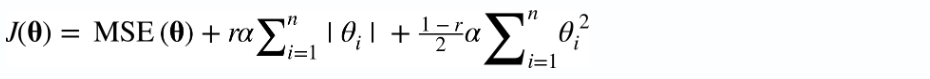

* ElasticNet을 사용한 간단한 예제

In [ ]:
from sklearn.linear_model import ElasticNet
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)
elastic_net.fit(X, y)
elastic_net.predict([[1.5]])

array([1.54333232])

## 5.2 단순 선형 회귀를 통한 회귀 이해
* 단순 선형 회귀: 독립변수도 하나, 종속변수도 하나인 선형 회귀

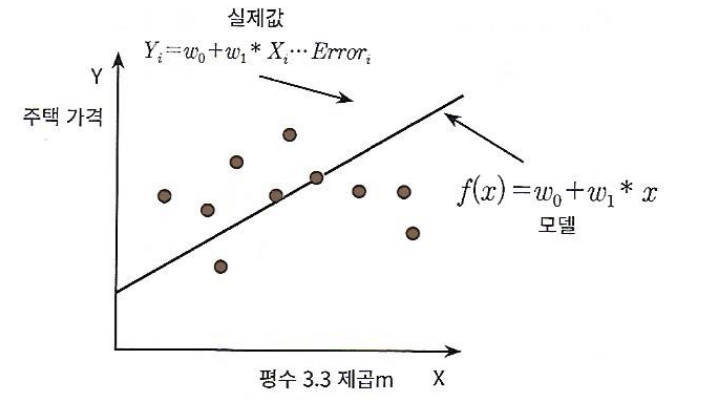

* 잔차: 실제 값과 회귀 모델의 차이에 따른 오류 값
* 최적의 회귀를 만든다는 것은 전체 데이터의 잔차(오류 값) 합이 최소가 되는 모델을 만든다는 의미
* 동시에 오류 값 합이 최소가 될 수 있는 최적의 회귀 계수를 찾는다는 의미

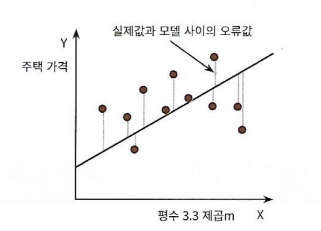

* RSS(Residual Sum of Square)=$Error^2$

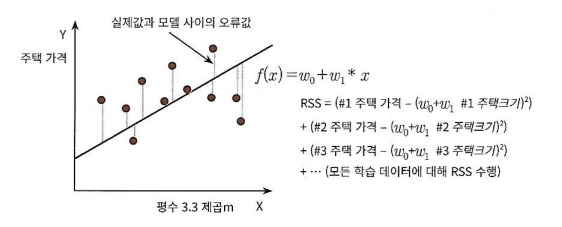

* 비용(cost)함수(손실함수, loss function): $RSS(w_0, w_1)={{1}\over{N}}\sum_{i=1}^{N}(y_i-(w_0+w_1x_i))^2$

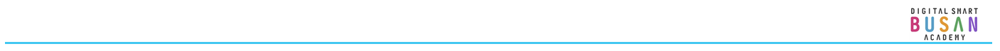

## 5.3 비용 최소화하기 - 경사 하강법(Gradient Descent) 소개

* 경사 하강법의 핵심은 "어떻게 하면 오류가 작아지는 방향으로 w 값을 보정할 수 있을까?"

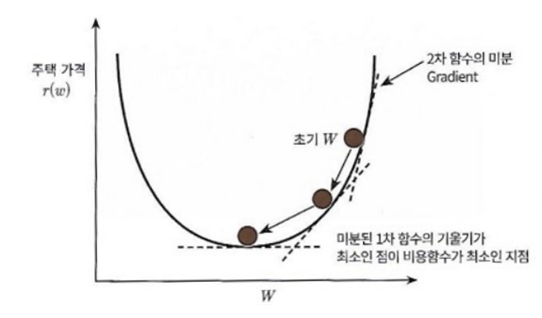

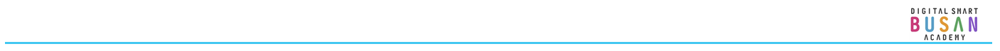

* 비용 함수 $RSS(w_0, w_1)=R(w)={{1}\over{N}}\sum_{i=1}^{N}(y_i-(w_0+w_1x_i))^2$를 미분해서 미분 함수의 최솟값을 구함
* $R(w)$를 최소화하는 $w_0$와 $w_1$의 값 --> $R(w)$를 $w_0$, $w_1$으로 편미분한 결과

$${{ \partial R(w)}\over{ \partial w_1}}={{2}\over{N}}\sum_{i=1}^{N}-x_i*(y_i-(w_0+w_1x_i)=-{{2}\over{N}}\sum_{i=1}^{N}x_i*(실제값_i-예측값_i)$$

$${{ \partial R(w)}\over{ \partial w_1}}={{2}\over{N}}\sum_{i=1}^{N}-(y_i-(w_0+w_1x_i)=-{{2}\over{N}}\sum_{i=1}^{N}(실제값_i-예측값_i)$$



* $w_1, w_0$의 편미분 결괏값 $-{{2}\over{N}}\sum_{i=1}^{N}x_i*(실제값_i-예측값_i)$, $-{{2}\over{N}}\sum_{i=1}^{N}(실제값_i-예측값_i)$를 반복적으로 보정하면서 $w_1, w_0$값을 업데이트하면 비용 함수 $R(w)$가 최소가 되는 $w_1, w_0$의 값을 구할 수 있다.
  * $새로운 w_1=이전 w_1-\{-{{2}\over{N}}\sum_{i=1}^{N}x_i*(실제값_i-예측값_i)\}$
  * 위 편미분 값이 너무 클 수 있기 때문에 보정 계수(학습률) $\eta$을 곱함
    * $새로운 w_1=이전 w_1+\eta{{2}\over{N}}\sum_{i=1}^{N}x_i*(실제값_i-예측값_i)$
    * $새로운 w_0=이전 w_0+\eta{{2}\over{N}}\sum_{i=1}^{N}(실제값_i-예측값_i)$
* 경사 하강법의 일반적인 프로세스
  * step 1: $w_1, w_0$를 임의의 값으로 설정하고 첫 비용 함수의 값을 계산한다.
  * step 2: $w_1$을 $ w_1+\eta{{2}\over{N}}\sum_{i=1}^{N}x_i*(실제값_i-예측값_i)$, $w_0$을 $w_0+\eta{{2}\over{N}}\sum_{i=1}^{N}(실제값_i-예측값_i)$으로 업데이트한 후 다시 비용 함수의 값을 계산한다.
  * step 3: 비용 함수가 감소하는 방향성으로 주어진 횟수만큼 step 2를 반복하면서 $w_1, w_0$를 계속 업데이트한다.

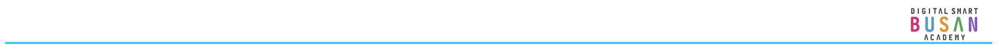  


* **[참고] 경사 하강법의 문제점**
* 적절한 학습률(Learning Rate), 지역 최솟값(Local Minimum)
* 통상적으로 학습률과 기울기 정보를 혼합하여 내가 나아갈 방향과 거리를 결정

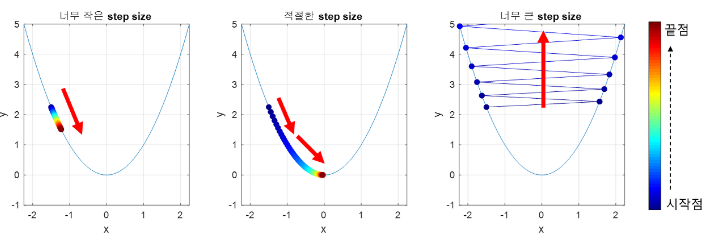

* 학습률이 높으면 높을수록 더욱더 많이 나아간다.
* 학습률이 높으면 한 번에 이동하는 거리가 커지므로 최적값에 빨리 수렴할 수 있다는 장점이 있다.
* 하지만 너무 크게 설정하면 최적값에 수렴하지 못하고 다른 곳으로 발산하는 현상이 나타날 수 있다.
* 정 반대로 학습률이 낮으면 발산하지 않는 대신 최적값에 수렴하는 시간이 오래 걸릴 수 있다.
* 추가적으로, 학습 시간 혹은 검증 세트의 손실 값에 따라 학습률을 조절하는 기법을 Scheduling

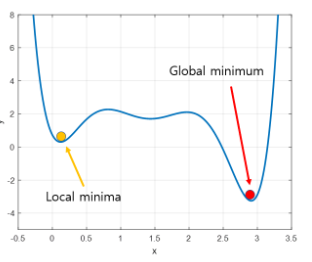

* 두 번째로 Local Minimum(지역 최솟값)에 안착해버릴 수 있다.

* 실제로 우리는 전역 최솟값을 찾고 싶지만, 어떤 이유로 인해 지역 최솟값에 빠지는 경우 탈출하지 못하고 해당 위치로 수렴할 가능성이 존재
* 운이 안 좋다면 Local Minimum에 빠져 탈출하지 못하고, 해당 Local Minimum이 Global Minimum이라고 인식되어 Suboptimal 한 결과가 도출될 수 있다.

* 해결법
  * 학습 도중에 학습률을 지속적으로 바꾸는 Adaptive Gradient Descent가 있고,
  * Local Minimum에 빠지는 경우를 방지하기 위해 관성력을 추가한 Momentum GD가 있다.

* 경사 하강법을 파이썬 코드를 구현

  * **실제값을 Y=4X+6 시뮬레이션하는 데이터 값 생성**

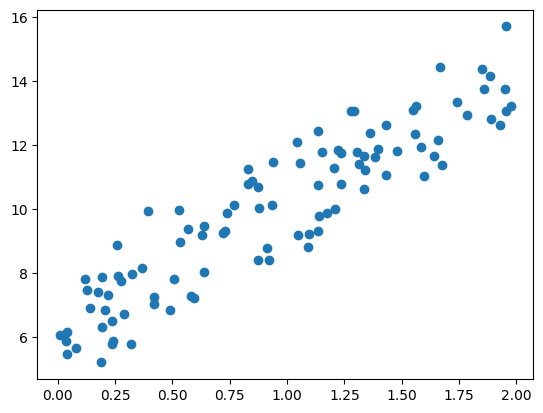

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(0)
# y = 4X + 6 식을 근사(w1=4, w0=6). random 값은 Noise를 위해 만듬
X = 2 * np.random.rand(100,1)
y = 6 +4 * X+ np.random.randn(100,1)

# X, y 데이터 셋 scatter plot으로 시각화
plt.scatter(X, y)

In [ ]:
X.shape, y.shape

((100, 1), (100, 1))

**w0과 w_1의 값을 최소화 할 수 있도록 업데이트 수행하는 함수 생성**

* 예측 배열 y_pred는 np.dot(X, w1.T) + w0 임
100개의 데이터 X(1,2,...,100)이 있다면 예측값은 w0 + X(1)*w1 + X(2)*w1 +..+ X(100)*w1이며, 이는 입력 배열 X와 w1 배열의 내적임.
* 새로운 w1과 w0를 update함

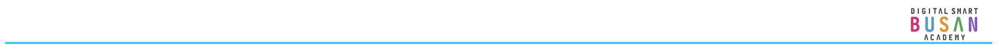

In [ ]:
# w1 과 w0 를 업데이트 할 w1_update, w0_update를 반환.
def get_weight_updates(w1, w0, X, y, learning_rate=0.01):
    N = len(y)
    # 먼저 w1_update, w0_update를 각각 w1, w0의 shape와 동일한 크기를 가진 0 값으로 초기화
    w1_update = np.zeros_like(w1)
    w0_update = np.zeros_like(w0)
    # 예측 배열 계산하고 예측과 실제 값의 차이 계산
    y_pred = np.dot(X, w1.T) + w0
    diff = y-y_pred

    # w0_update를 dot 행렬 연산으로 구하기 위해 모두 1값을 가진 행렬 생성
    w0_factors = np.ones((N,1))

    # w1과 w0을 업데이트할 w1_update와 w0_update 계산
    w1_update = -(2/N)*learning_rate*(np.dot(X.T, diff))
    w0_update = -(2/N)*learning_rate*(np.dot(w0_factors.T, diff))

    return w1_update, w0_update

In [ ]:
w0 = np.zeros((1,1))
w1 = np.zeros((1,1))
y_pred = np.dot(X, w1.T) + w0
diff = y-y_pred
print(diff.shape)
w0_factors = np.ones((100,1))
w1_update = -(2/100)*0.01*(np.dot(X.T, diff))
w0_update = -(2/100)*0.01*(np.dot(w0_factors.T, diff))
print(w1_update.shape, w0_update.shape)
w1, w0

(100, 1)
(1, 1) (1, 1)


(array([[0.]]), array([[0.]]))

**반복적으로 경사 하강법을 이용하여 get_weigth_updates()를 호출하여 w1과 w0를 업데이트 하는 함수 생성**

In [ ]:
# 입력 인자 iters로 주어진 횟수만큼 반복적으로 w1과 w0를 업데이트 적용함.
def gradient_descent_steps(X, y, iters=10000):
    # w0와 w1을 모두 0으로 초기화.
    w0 = np.zeros((1,1))
    w1 = np.zeros((1,1))

    # 인자로 주어진 iters 만큼 반복적으로 get_weight_updates() 호출하여 w1, w0 업데이트 수행.
    for ind in range(iters):
        w1_update, w0_update = get_weight_updates(w1, w0, X, y, learning_rate=0.01)
        w1 = w1 - w1_update
        w0 = w0 - w0_update

    return w1, w0

**예측 오차 비용을 계산을 수행하는 함수 생성 및 경사 하강법 수행**

In [ ]:
def get_cost(y, y_pred):
    N = len(y)
    cost = np.sum(np.square(y - y_pred))/N
    return cost

w1, w0 = gradient_descent_steps(X, y, iters=1000)
print("w1:{0:.3f} w0:{1:.3f}".format(w1[0,0], w0[0,0]))
y_pred = w1[0,0] * X + w0
print('Gradient Descent Total Cost:{0:.4f}'.format(get_cost(y, y_pred)))

w1:4.022 w0:6.162
Gradient Descent Total Cost:0.9935


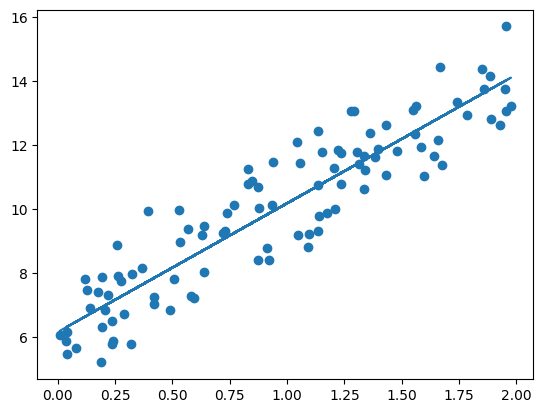

In [ ]:
plt.scatter(X, y)
plt.plot(X,y_pred)

**미니 배치 확률적 경사 하강법을 이용한 최적 비용함수 stochastic_gradient_descent_steps() 도출**

In [ ]:
def stochastic_gradient_descent_steps(X, y, batch_size=10, iters=1000):
    w0 = np.zeros((1,1))
    w1 = np.zeros((1,1))
    prev_cost = 100000
    iter_index =0

    for ind in range(iters):
        np.random.seed(ind)
        # 전체 X, y 데이터에서 랜덤하게 batch_size만큼 데이터 추출하여 sample_X, sample_y로 저장
        stochastic_random_index = np.random.permutation(X.shape[0])
        sample_X = X[stochastic_random_index[0:batch_size]]
        sample_y = y[stochastic_random_index[0:batch_size]]
        # 랜덤하게 batch_size만큼 추출된 데이터 기반으로 w1_update, w0_update 계산 후 업데이트
        w1_update, w0_update = get_weight_updates(w1, w0, sample_X, sample_y, learning_rate=0.01)
        w1 = w1 - w1_update
        w0 = w0 - w0_update

    return w1, w0

In [ ]:
w1, w0 = stochastic_gradient_descent_steps(X, y, iters=1000)
print("w1:",round(w1[0,0],3),"w0:",round(w0[0,0],3))
y_pred = w1[0,0] * X + w0
print('Stochastic Gradient Descent Total Cost:{0:.4f}'.format(get_cost(y, y_pred)))


w1: 4.028 w0: 6.156
Stochastic Gradient Descent Total Cost:0.9937


* 피처가 m개($X_1, X_2, \cdots, X_m$) 있다면 그에 따른 회귀 계수 m+1개
  * 예측식 $\hat{Y}=w_0+w_1*X_1+w_1*X_2+ \cdots+w_m* X_m$
  * 데이터의 개수가 n이고 피처 m개의 입력 행렬 $X_{mat}$, 회귀 계수 $w_1, w_2, \cdots, w_m$을 $W$ 배열로 표기
    * 예측 행렬 $\hat{Y}=np.dot(X_{mat}, W)+w_0$

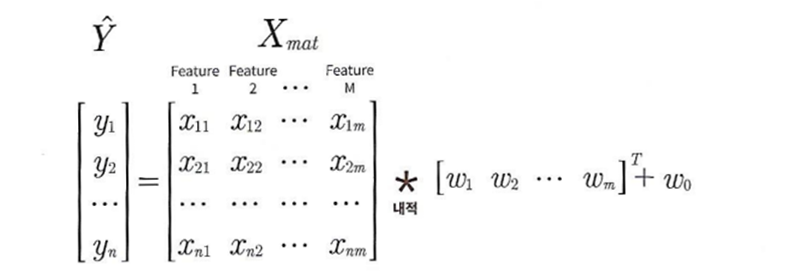   

* $w_0$를 Weight의 배열인 $W$안에 포함시키기 위해서 $X_{mat}$의 맨 처음 열에 모든 데이터의 값이 1인 피처 Feat 0을 추가
  * 회귀 예측값 $\hat{Y}=X_{mat}* W^T$

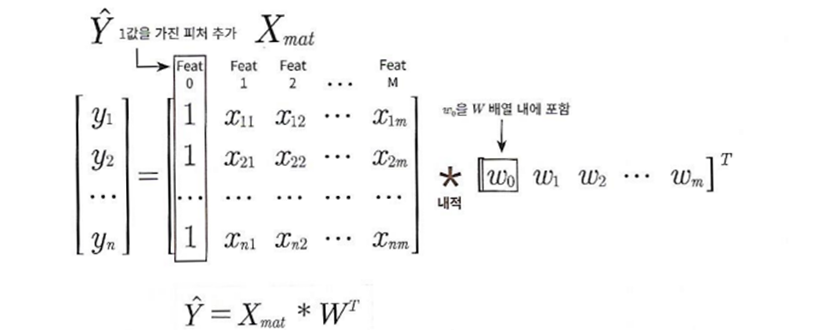  

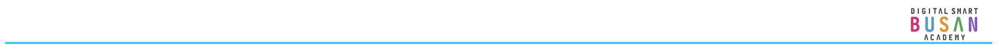

## 5.4 사이킷런 LinearRegression을 이용한 보스턴 주택 가격 예측
* 사이킷런이 지원하는 다양한 linear_models 모듈을 확인 https://scikit-learn.org/stable/modules/classes.html#module-sklearn.linear_model

### **LinearRegression 클래스 -Ordinary Least Squares**
* LinearRegression 클래스는 예측값과 실제 값의 RSS(Residual Sum of Squares)를 최소화해 OLS(Ordinary Least Squares) 추정 방식으로 구현한 클래스
* LinearRegression 클래스는 fit() 메서드로 $X, y$ 배열을 입력받으면 회귀 계수(Coefficients)인 $W$를 coef_ 속성에 저장

```
class sklearn.linear_model.LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=1)
```

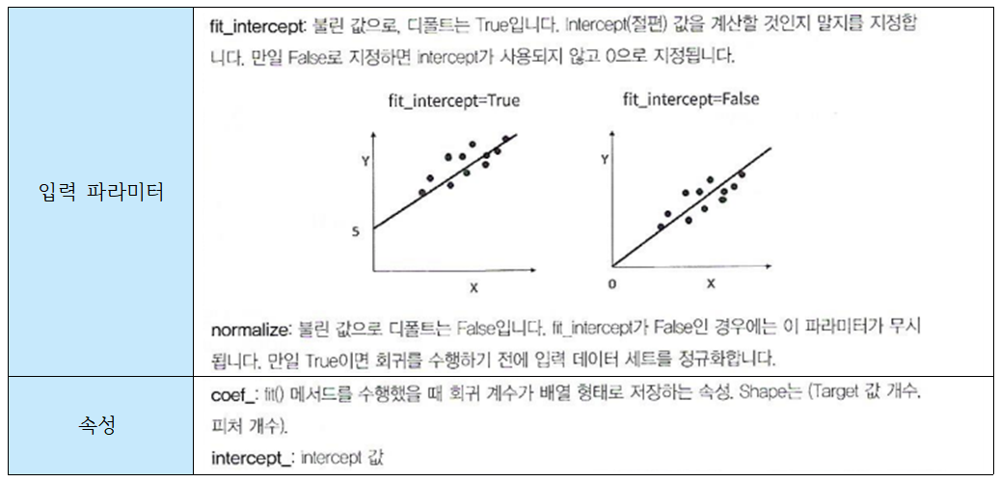

* OLS 기반의 회귀 계수 계산은 입력 피처의 독립성에 많은 영양을 받음
  * 다중공선성(multi-collinearity) 문제: 피처간의 상관관계가 매우 높은 경우 분산이 매우 커져서 오류에 매우 민감
    - 상관관계가 높은 피처가 많은 경우 독립적인 중요한 피처만 남기고 제거하거나 규제를 적용
    - 매우 많은 피처가 다중 공선성 문제를 가지고 있다면 PCA(Principal Component Analysis, 주성분분석)를 통해 차원 축소도 고려


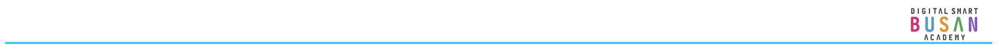

## **회귀 평가 지표**

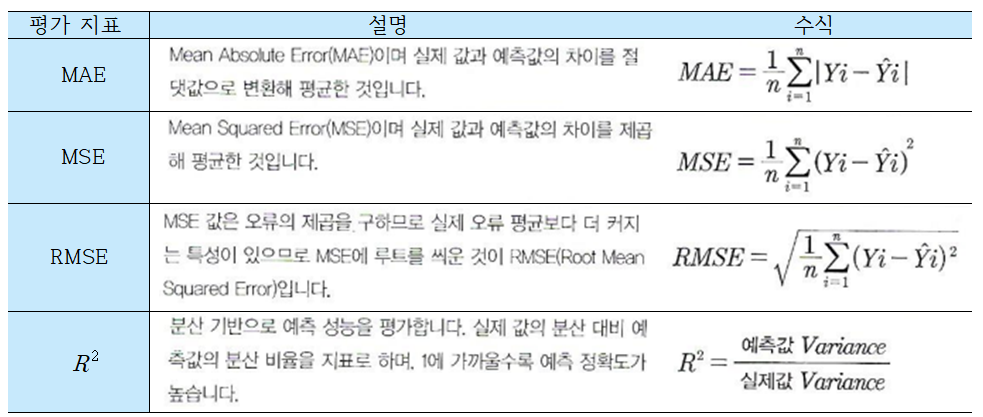

* 그 밖에 MSLE(Mean Squared Log Error), RMSLE(Root Mean Squared Log Error)
* 사이킷런에서는 RMSE를 제공하지 않음(MSE에 제곱근을 씌워서 계산하는 함수를 직접 만듬)
* 사이킷런 평가 지표 API와 scoring 파라미터의 적용 값

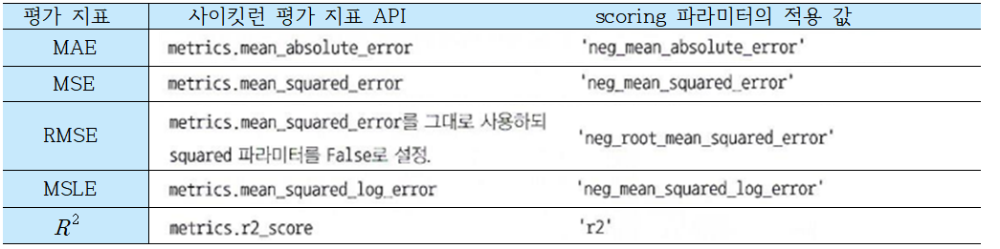

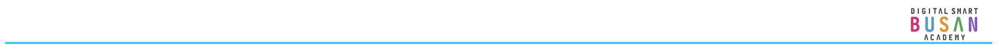

**LinearRegression을 이용해 보스턴 주택 가격 회귀 구현**


* 보스턴 주택가격 데이터셋의 윤리적인 문제로 sklearn.datasets 1.2 버전에서 load_boston()이 삭제됨(교재에서 제공하는 코드는 이전 구현 참고)

```
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy import stats
from sklearn.datasets import load_boston
%matplotlib inline

# boston 데이타셋 로드
boston = load_boston()

# boston 데이타셋 DataFrame 변환
bostonDF = pd.DataFrame(boston.data , columns = boston.feature_names)

# boston dataset의 target array는 주택 가격임. 이를 PRICE 컬럼으로 DataFrame에 추가함.
bostonDF['PRICE'] = boston.target
print('Boston 데이타셋 크기 :',bostonDF.shape)
bostonDF.head()
```



* 출력결과

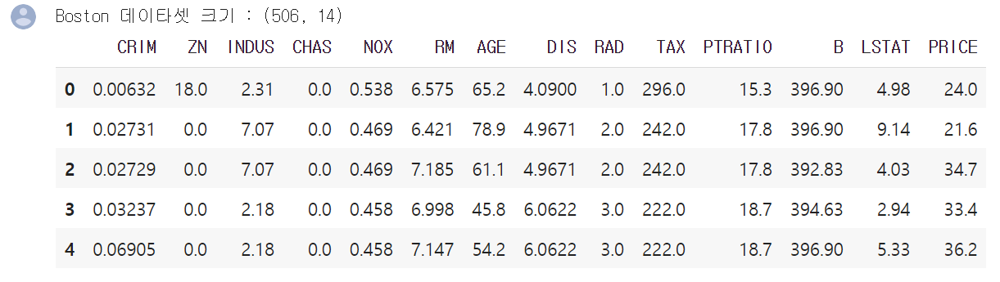

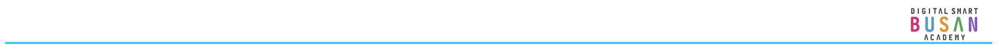

* 보스턴 주택 가격 데이터셋

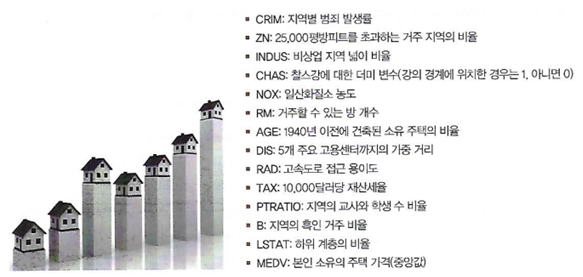



* 보스턴 주택가격 데이터(HousingData.csv)를 캐글에서 다운로드받음
  * HousingData.csv 다운로드 https://www.kaggle.com/datasets/altavish/boston-housing-dataset

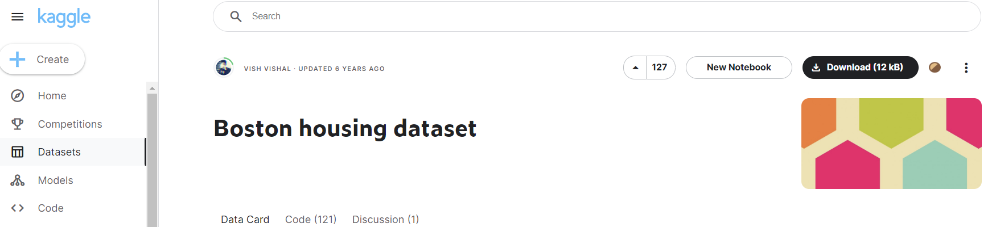

In [ ]:
import numpy as np
import pandas as pd

bostonDF = pd.read_csv('HousingData.csv')
print('Boston 데이타셋 크기 :',bostonDF.shape)
bostonDF.head()

Boston 데이타셋 크기 : (506, 14)


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,NaN,36.2


* 각 컬럼별로 주택가격에 미치는 영향도를 조사

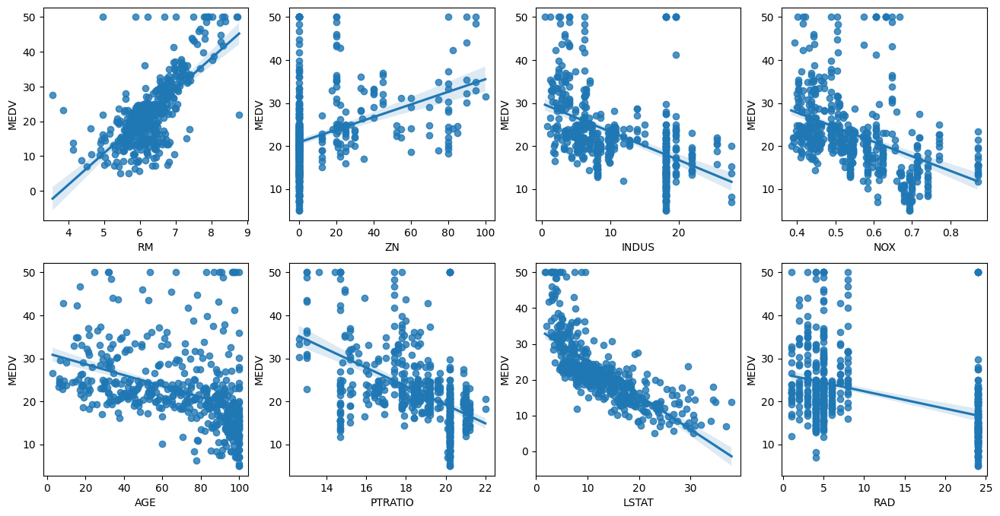

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
# 2개의 행과 4개의 열을 가진 subplots를 이용. axs는 4x2개의 ax를 가짐.
fig, axs = plt.subplots(figsize=(16,8) , ncols=4 , nrows=2)
lm_features = ['RM','ZN','INDUS','NOX','AGE','PTRATIO','LSTAT','RAD']
for i , feature in enumerate(lm_features):
    row = int(i/4)
    col = i%4
    # 시본의 regplot을 이용해 산점도와 선형 회귀 직선을 함께 표현
    sns.regplot(x=feature , y='MEDV',data=bostonDF , ax=axs[row][col])

* RM(방 개수)과 LSTAT(하위 계층의 비율)의 MEDV 영향도가 가장 두드러지게 나타남
  * RM은 양방향의 선형성
  * LSTAT은 음 방향의 선형성

**학습과 테스트 데이터 세트로 분리하고 학습/예측/평가 수행**

* LinearRegression 클래스를 이용해 보스턴 주택 가격의 회귀 모델을 만듬
  * train_test_split()을 이용해 학습과 테스트 데이터 세트를 분리해 학습과 예측을 수행
  * metrics 모듈의 mean_squared_error()와 r2_score()를 이용해 MSE와 R2 Score를 측정

In [ ]:
bostonDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     486 non-null    float64
 1   ZN       486 non-null    float64
 2   INDUS    486 non-null    float64
 3   CHAS     486 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      486 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    486 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


In [ ]:
bostonDF=bostonDF.fillna(value=bostonDF.mean())

In [ ]:
bostonDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error , r2_score

y_target = bostonDF['MEDV']
X_data = bostonDF.drop(['MEDV'],axis=1,inplace=False)

X_train , X_test , y_train , y_test = train_test_split(X_data , y_target ,test_size=0.3, random_state=156)

In [ ]:
# Linear Regression OLS로 학습/예측/평가 수행.
lr = LinearRegression()
lr.fit(X_train ,y_train )
y_preds = lr.predict(X_test)
mse = mean_squared_error(y_test, y_preds)
rmse = np.sqrt(mse)

print('MSE : {0:.3f} , RMSE : {1:.3F}'.format(mse , rmse))
print('Variance score : {0:.3f}'.format(r2_score(y_test, y_preds)))

MSE : 17.300 , RMSE : 4.159
Variance score : 0.757


In [ ]:
print('절편 값:',lr.intercept_)
print('회귀 계수값:', np.round(lr.coef_, 1))

절편 값: 38.71382688431513
회귀 계수값: [ -0.1   0.1  -0.    3.2 -18.8   3.7  -0.   -1.8   0.3  -0.   -0.9   0.
  -0.5]


In [ ]:
# 회귀 계수를 큰 값 순으로 정렬하기 위해 Series로 생성. index가 컬럼명에 유의
coeff = pd.Series(data=np.round(lr.coef_, 1), index=X_data.columns )
coeff.sort_values(ascending=False)

,0
RM,3.7
CHAS,3.2
RAD,0.3
ZN,0.1
INDUS,-0.0
AGE,-0.0
TAX,-0.0
B,0.0
CRIM,-0.1
LSTAT,-0.5


* RM이 양의 값으로 회귀 계수가 가장 크며, NOX 피처의 회귀 계수 - 값이 상당히 큼
* 5개의 폴드 세트에서 cross_val_score()를 이용해 교차 검증으로 MSE와 RMSE를 측정

In [ ]:
from sklearn.model_selection import cross_val_score

y_target = bostonDF['MEDV']
X_data = bostonDF.drop(['MEDV'],axis=1,inplace=False)
lr = LinearRegression()

# cross_val_score( )로 5 Fold 셋으로 MSE 를 구한 뒤 이를 기반으로 다시  RMSE 구함.
neg_mse_scores = cross_val_score(lr, X_data, y_target, scoring="neg_mean_squared_error", cv = 5)
rmse_scores  = np.sqrt(-1 * neg_mse_scores)
avg_rmse = np.mean(rmse_scores)

# cross_val_score(scoring="neg_mean_squared_error")로 반환된 값은 모두 음수
print(' 5 folds 의 개별 Negative MSE scores: ', np.round(neg_mse_scores, 2))
print(' 5 folds 의 개별 RMSE scores : ', np.round(rmse_scores, 2))
print(' 5 folds 의 평균 RMSE : {0:.3f} '.format(avg_rmse))

 5 folds 의 개별 Negative MSE scores:  [-11.79 -25.64 -36.25 -81.09 -34.36]
 5 folds 의 개별 RMSE scores :  [3.43 5.06 6.02 9.01 5.86]
 5 folds 의 평균 RMSE : 5.877 


* 5개 폴드 세트에 대해서 교차 검증을 수행한 결과, 평균 RMSE는 약 5.877
* cross_val_score(scoring="neg_mean_squared_error")로 반환된 값은 모두 음수임을 알 수 있음

* **[참고] 교차검증(Cross Validation)**
* 데이터를 여러 부분으로 나누고, 각 부분을 훈련과 테스트 용도로 번갈아 사용하여 모델을 평가하는 방법(모델의 일반화 성능을 더 정확하게 측정)

* 특징
  * 훈련데이터가 많지 않을 때 사용
  * 훈련 데이터 (training data)로 학습하고 테스트 데이터(test data)로 평가하는 경우, 해당 테스트 데이터에만 과적합되는 모델이 생성되어 일반화 성능이 떨어진다.
  * 훈련 데이터 (training data)에서 검증 데이터(validation data)를 떼어내어 모형을 검증하는 과정을 여러 번 반복
* K-폴드 교차 검증
  * 데이터셋을 K개의 부분(폴드)으로 나누는 방법
  * K번의 다른 실험을 수행하며, 매번 서로 다른 폴드를 테스트 데이터로 사용하고 나머지 K-1개의 폴드를 학습 데이터로 사용
  * K번의 실험을 통해 얻은 성능 지표들을 평균내어 최종 성능을 산출
  * 장점: 모든 데이터가 한 번씩은 테스트 데이터로 사용되므로, 데이터를 효율적으로 사용할 수 있다.
  * 단점: K값이 크면 연산 비용이 증가
  * (예) 3-Fold cross validation
   * 훈련 데이터를 3개의 동일한 크기로 분할하여 분할된 2개의 학습 데이터로 학습하고 1개의 검증 데이터로 분리하여 평가
   * 검증데이터를 교차하여 3번동안 검증한 뒤 모델의 평가 결과들을 평균하여 종합적으로 성능을 평가

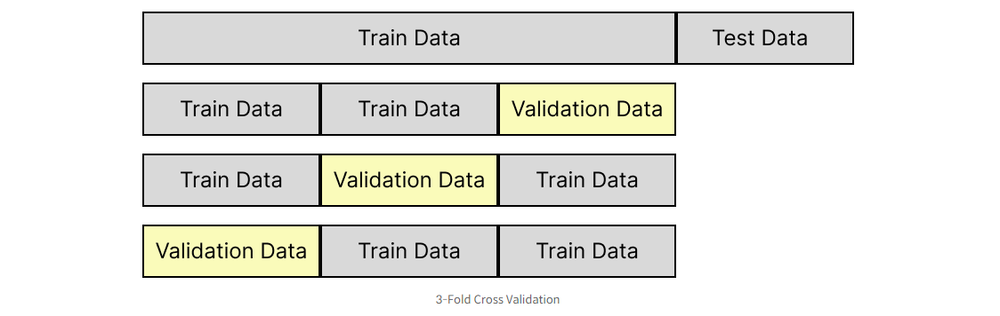

In [ ]:
# n_splits를 5개로 나눠 kfold를 생성하여 데이터를 나눠 모델을 학습시킨뒤 해당 모델의 점수를 모두 더해 산술평균하여 결과를 표현
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris

iris = load_iris()
scores = []
model = DecisionTreeClassifier(random_state=42)
kfold = KFold(n_splits=5)
for i, (trainData, validateData) in enumerate(kfold.split(iris.data)):
    model.fit(iris.data[trainData], iris.target[trainData])
    print(f"{i+1}번째 모델 점수 : {model.score(iris.data[validateData], iris.target[validateData])}")
    scores.append(model.score(iris.data[validateData], iris.target[validateData]))
print(sum(scores)/5)

1번째 모델 점수 : 1.0
2번째 모델 점수 : 1.0
3번째 모델 점수 : 0.8333333333333334
4번째 모델 점수 : 0.9333333333333333
5번째 모델 점수 : 0.8
0.9133333333333333


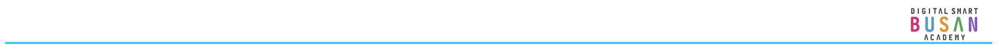

## 5-5. 다향 회귀(Polynomial Regression)와 과(대)적합/과소적합(오버피팅/언더피팅) 이해
### **다항 회귀(Polynomial Regression) 이해**

* 다항 회귀의 예: $y=w_0+w_1*x_1+w_2*x_2+w_3*x_1*x_2+w_4*x_1^2+w_5*x_2^2$
  * 새로운 변수 $z=[x_1, x_2, x_1*x_2, x_1^2, x_2^2]$에 대해 $y=w_0+w_1*z_1+w_2*z_2+w_3*z_3+w_4*z_4+w_5*z_5$와 같이 표현할 수 있기에 선형 회귀

* 피처 $X$에 대해 target $Y$ 값의 관계를 단순 선형 회귀 직선형으로 표현한 것보다 다항 회귀 곡선형으로 표현한 것이 더 예측 성능이 높다.

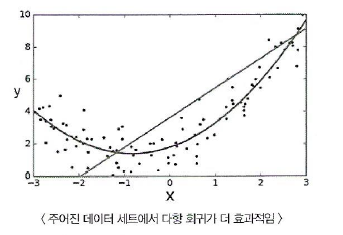




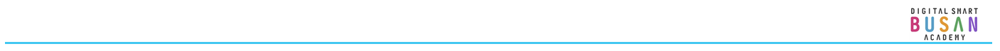

**PolynomialFeatures 클래스로 다항식 변환**

* [예제] PolynomialFeatures 클래스를 이용해 단항값 $[x_1, x_2]$를 2차 다항값으로 $[1, x_1, x_2, x_1^2, x_1x_2, x_2^2]$로 변환

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
import numpy as np

# 다항식으로 변환한 단항식 생성, [[0,1],[2,3]]의 2X2 행렬 생성
X = np.arange(4).reshape(2,2)
print('일차 단항식 계수 feature:\n',X )

# degree = 2 인 2차 다항식으로 변환하기 위해 PolynomialFeatures를 이용하여 변환
poly = PolynomialFeatures(degree=2)
poly.fit(X)
poly_ftr = poly.transform(X)
print('변환된 2차 다항식 계수 feature:\n', poly_ftr)

# 일차 단항식 계수 feature:
# [[0 1]
# [2 3]]
# 변환된 2차 다항식 계수 feature:
# [[1. 0. 1. 0. 0. 1.]
# [1. 2. 3. 4. 6. 9.]]

일차 단항식 계수 feature:
 [[0 1]
 [2 3]]
변환된 2차 다항식 계수 feature:
 [[1. 0. 1. 0. 0. 1.]
 [1. 2. 3. 4. 6. 9.]]


* 3차 다항식 결정값을 구하는 함수 polynomial_func(X) 생성. 즉 회귀식은 결정값 $y = 1+ 2x_1 + 3x_1^2 + 4x_2^3$

In [ ]:
def polynomial_func(X):
    y = 1 + 2*X[:,0] + 3*X[:,0]**2 + 4*X[:,1]**3
    print(X[:, 0])
    print(X[:, 1])
    return y

X = np.arange(0,4).reshape(2,2)

print('일차 단항식 계수 feature: \n' ,X)
y = polynomial_func(X)
print('삼차 다항식 결정값: \n', y)

# 일차 단항식 계수 feature:
# [[0 1]
# [2 3]]
# [0 2]
# [1 3]
# 삼차 다항식 결정값:
# [  5 125]

일차 단항식 계수 feature: 
 [[0 1]
 [2 3]]
[0 2]
[1 3]
삼차 다항식 결정값: 
 [  5 125]


3차 다항식 계수의 피처값과 3차 다항식 결정값으로 학습

In [ ]:
# 3 차 다항식 변환
poly_ftr = PolynomialFeatures(degree=3).fit_transform(X)
print('3차 다항식 계수 feature: \n',poly_ftr)

# Linear Regression에 3차 다항식 계수 feature와 3차 다항식 결정값으로 학습 후 회귀 계수 확인
model = LinearRegression()
model.fit(poly_ftr,y)
print('Polynomial 회귀 계수\n' , np.round(model.coef_, 2))
print('Polynomial 회귀 Shape :', model.coef_.shape)

# 3차 다항식 계수 feature:
# [[ 1.  0.  1.  0.  0.  1.  0.  0.  0.  1.]
# [ 1.  2.  3.  4.  6.  9.  8. 12. 18. 27.]]
# Polynomial 회귀 계수
# [0.   0.18 0.18 0.36 0.54 0.72 0.72 1.08 1.62 2.34]
# Polynomial 회귀 Shape : (10,)

3차 다항식 계수 feature: 
 [[ 1.  0.  1.  0.  0.  1.  0.  0.  0.  1.]
 [ 1.  2.  3.  4.  6.  9.  8. 12. 18. 27.]]
Polynomial 회귀 계수
 [0.   0.18 0.18 0.36 0.54 0.72 0.72 1.08 1.62 2.34]
Polynomial 회귀 Shape : (10,)


**사이킷런 파이프라인(Pipeline)을 이용하여 3차 다항회귀 학습**

* 사이킷런의 Pipeline 객체는 Feature 엔지니어링 변환과 모델 학습/예측을 순차적으로 결합

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
import numpy as np

def polynomial_func(X):
    y = 1 + 2*X[:,0] + 3*X[:,0]**2 + 4*X[:,1]**3
    return y

# Pipeline 객체로 Streamline 하게 Polynomial Feature변환과 Linear Regression을 연결
model = Pipeline([('poly', PolynomialFeatures(degree=3)),
                  ('linear', LinearRegression())])
X = np.arange(4).reshape(2,2)
y = polynomial_func(X)

model = model.fit(X, y)
print('Polynomial 회귀 계수\n', np.round(model.named_steps['linear'].coef_, 2))

Polynomial 회귀 계수
 [0.   0.18 0.18 0.36 0.54 0.72 0.72 1.08 1.62 2.34]


### 다항 회귀를 이용한 과소적합(Underfitting) 및 과적합(Overfitting) 이해

* 과소적합(underfitting)
  * 학습 데이터조차 제대로 학습x(데이터 내재적인 구조 반영x), 편향이 높게(high bias) 학습되어 새로운 데이터를 예측하지 못하는 상태
* 과대적합(overfitting)
  * 학습 데이터를 과하게 학습(지엽적인 특성까지 반영), 분산이 높게(high variance) 학습되어 새로운 데이터를 예측하지 못하는 상태
* 결론적으로, 편향을 높이면 학습이 잘 안되고, 편향이 낮으면 분산이 높아지는 절충(trade off) 관계로 두 가지 에러(error)를 최소화 할 수 있는 지점에서 모델의 복잡도가 결정될 때 모델의 좋은 성능을 기대할 수 있음

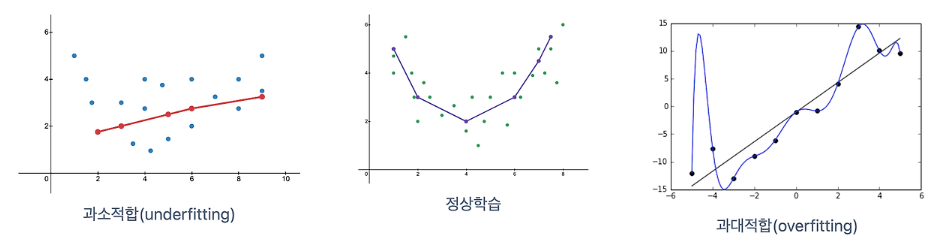

* 과소적합, 과대적합 해결방안
  * 과소적합(underfitting)
    - 모델 파라미터가 많은 복잡한 모델 고려
    - 학습 데이터 확보
  * 과대적합(overfitting)
    - 적당한 복잡도 모델 고려
    - 불필요한 노이즈 데이터 제거
    - 정규화 제약

**다항 회귀를 이용한 보스턴 주택가격 예측**

In [ ]:
# PolynomialFeatures(degree=3)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error , r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
import numpy as np

# boston 데이터셋 로드
bostonDF = pd.read_csv('HousingData.csv')
bostonDF=bostonDF.fillna(value=bostonDF.mean())

# boston dataset의 target array는 주택 가격임. 이를 MEDV 컬럼으로 DataFrame에 추가함.
#bostonDF['MEDV'] = boston.target
#print('Boston 데이타셋 크기 :',bostonDF.shape)

y_target = bostonDF['MEDV']
X_data = bostonDF.drop(['MEDV'],axis=1,inplace=False)


X_train , X_test , y_train , y_test = train_test_split(X_data , y_target ,test_size=0.3, random_state=156)

## Pipeline을 이용하여 PolynomialFeatures 변환과 LinearRegression 적용을 순차적으로 결합.
p_model = Pipeline([('poly', PolynomialFeatures(degree=3, include_bias=False)),
                  ('linear', LinearRegression())])

p_model.fit(X_train, y_train)
y_preds = p_model.predict(X_test)
mse = mean_squared_error(y_test, y_preds)
rmse = np.sqrt(mse)


print('MSE : {0:.3f} , RMSE : {1:.3F}'.format(mse , rmse))
print('Variance score : {0:.3f}'.format(r2_score(y_test, y_preds)))

MSE : 64487.593 , RMSE : 253.944
Variance score : -904.126


In [ ]:
# PolynomialFeatures(degree=2)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error , r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
import numpy as np

# boston 데이터셋 로드
bostonDF = pd.read_csv('HousingData.csv')
bostonDF=bostonDF.fillna(value=bostonDF.mean())

# boston dataset의 target array는 주택 가격임. 이를 MEDV 컬럼으로 DataFrame에 추가함.
#bostonDF['MEDV'] = boston.target
#print('Boston 데이타셋 크기 :',bostonDF.shape)

y_target = bostonDF['MEDV']
X_data = bostonDF.drop(['MEDV'],axis=1,inplace=False)


X_train , X_test , y_train , y_test = train_test_split(X_data , y_target ,test_size=0.3, random_state=156)

## Pipeline을 이용하여 PolynomialFeatures 변환과 LinearRegression 적용을 순차적으로 결합.
p_model = Pipeline([('poly', PolynomialFeatures(degree=2, include_bias=False)),
                  ('linear', LinearRegression())])

p_model.fit(X_train, y_train)
y_preds = p_model.predict(X_test)
mse = mean_squared_error(y_test, y_preds)
rmse = np.sqrt(mse)


print('MSE : {0:.3f} , RMSE : {1:.3F}'.format(mse , rmse))
print('Variance score : {0:.3f}'.format(r2_score(y_test, y_preds)))

MSE : 12.967 , RMSE : 3.601
Variance score : 0.818


In [ ]:
X_train_poly= PolynomialFeatures(degree=2, include_bias=False).fit_transform(X_train, y_train)
X_train_poly.shape, X_train.shape

((354, 104), (354, 13))

**cosine 곡선에 약간의 Noise 변동값을 더하여 실제값 곡선을 만듬**
* 사이킷런 홈페이지에서 다항 회귀를 이용해 과소적합과 과적합의 문제를 잘 보여주는 예제 발췌
  * 학습 데이터 30개의 임의의 데이터인 X, 그리고 X의 코사인 값에 약간의 잡음(Noise) 변동 값을 더한 target인 y로 구성

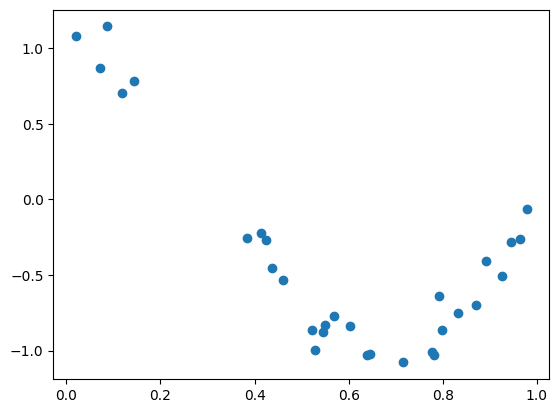

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
%matplotlib inline

# random 값으로 구성된 X값에 대해 Cosine 변환값을 반환.
def true_fun(X):
    return np.cos(1.5 * np.pi * X)

# X는 0 부터 1까지 30개의 random 값을 순서대로 sampling 한 데이타 입니다.
np.random.seed(0)
n_samples = 30
X = np.sort(np.random.rand(n_samples))

# y 값은 cosine 기반의 true_fun() 에서 약간의 Noise 변동값을 더한 값입니다.
y = true_fun(X) + np.random.randn(n_samples) * 0.1

plt.scatter(X, y)

* 다항식 차수를 각각 1, 4, 15로 변경하면서 cross_val_score()로 MSE값을 구해 예측 성능을 비교


Degree 1 회귀 계수는 [-2.] 입니다.
Degree 1 MSE 는 0.41 입니다.

Degree 4 회귀 계수는 [  0. -18.  24.  -7.] 입니다.
Degree 4 MSE 는 0.04 입니다.

Degree 15 회귀 계수는 [-2.98300000e+03  1.03899000e+05 -1.87416100e+06  2.03716220e+07
 -1.44873283e+08  7.09315363e+08 -2.47065792e+09  6.24561050e+09
 -1.15676510e+10  1.56894936e+10 -1.54006024e+10  1.06457264e+10
 -4.91377530e+09  1.35919645e+09 -1.70380786e+08] 입니다.
Degree 15 MSE 는 181238256.56 입니다.


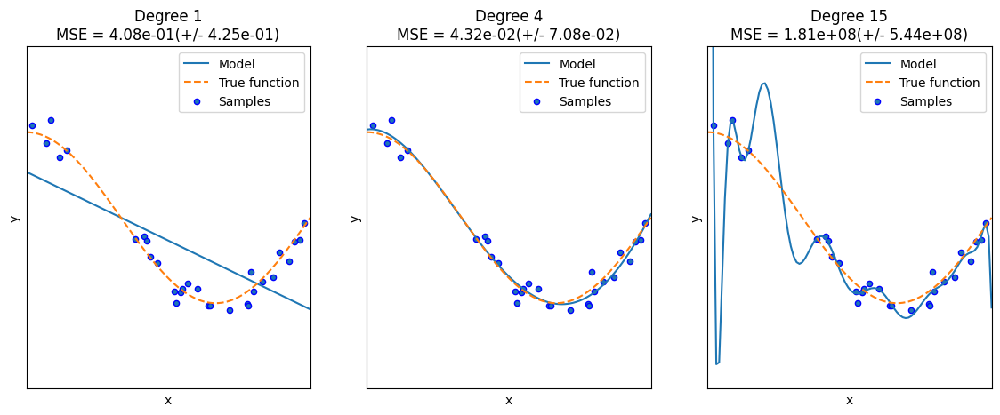

In [ ]:
plt.figure(figsize=(14, 5))
degrees = [1, 4, 15]

# 다항 회귀의 차수(degree)를 1, 4, 15로 각각 변화시키면서 비교합니다.
for i in range(len(degrees)):
    ax = plt.subplot(1, len(degrees), i + 1)
    plt.setp(ax, xticks=(), yticks=())

    # 개별 degree별로 Polynomial 변환합니다.
    polynomial_features = PolynomialFeatures(degree=degrees[i], include_bias=False)
    linear_regression = LinearRegression()
    pipeline = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])
    pipeline.fit(X.reshape(-1, 1), y)

    # 교차 검증으로 다항 회귀를 평가합니다.
    scores = cross_val_score(pipeline, X.reshape(-1,1), y,scoring="neg_mean_squared_error", cv=10)
    coefficients = pipeline.named_steps['linear_regression'].coef_
    print('\nDegree {0} 회귀 계수는 {1} 입니다.'.format(degrees[i], np.round(coefficients),2))
    print('Degree {0} MSE 는 {1:.2f} 입니다.'.format(degrees[i] , -1*np.mean(scores)))

    # 0 부터 1까지 테스트 데이터 세트를 100개로 나눠 예측을 수행합니다.
    # 테스트 데이터 세트에 회귀 예측을 수행하고 예측 곡선과 실제 곡선을 그려서 비교합니다.
    X_test = np.linspace(0, 1, 100)
    # 예측값 곡선
    plt.plot(X_test, pipeline.predict(X_test[:, np.newaxis]), label="Model")
    # 실제 값 곡선
    plt.plot(X_test, true_fun(X_test), '--', label="True function")
    plt.scatter(X, y, edgecolor='b', s=20, label="Samples")

    plt.xlabel("x"); plt.ylabel("y"); plt.xlim((0, 1)); plt.ylim((-2, 2)); plt.legend(loc="best")
    plt.title("Degree {}\nMSE = {:.2e}(+/- {:.2e})".format(degrees[i], -scores.mean(), scores.std()))

plt.show()

* 실선으로 표현된 예측 곡선은 다항 회귀 예측 곡선, 점선으로 표현된 곡선은 실제 데이터 세트 X, Y의 코사인 곡선
  * Degree 1 예측 곡선: 과소적합 모델, MSE 값은 약 0.41
  * Degree 4 예측 곡선: 실제 데이터 셑트와 유사한 모습, MSE 값은 약 0.04로 가장 뛰어난 예측 성능
  * Degree 15 예측 곡선: 과적합 모델, MSE 값은 약 182581084.83이 될 정도로 어처구니없는 오류 값이 발생
* Degree 1와 같은 모델은 고편향(High Bias)을 가졌다고 표현하고 Degree 15와 같은 모델은 고분산(High Variance)성을 가졌다고 표현함.

**편향-분산 트레이드오프(Bias-Varience Trade off)**
* [그림] ' 양궁 과녁' 편향과 분산의 고/저의 의미를 직관적으로 잘 표현

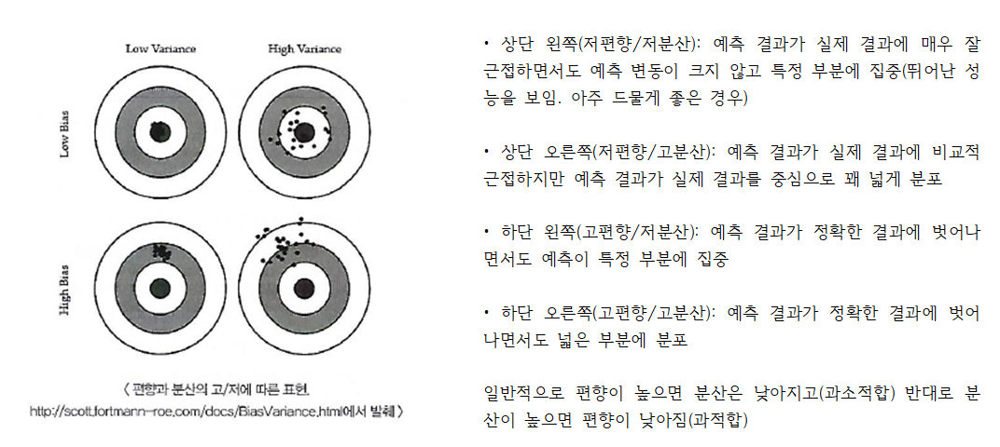

* [그림] 편향과 분산의 관계에 따른 전체 오류값의 변화
  * 편향이 너무 높으면 전체 오류가 높아지고 편향을 점점 낮추면 동시에 분산이 높아지고 전체 오류도 낮아짐
  * 편향을 낮추고 분산이 높이면서 전체 오류가 가장 낮아지는 '골디락스' 지점을 통과하면서 분산을 지속적으로 높이면 전체 오류 값이 증가 --> 예측 성능이 다시 저하

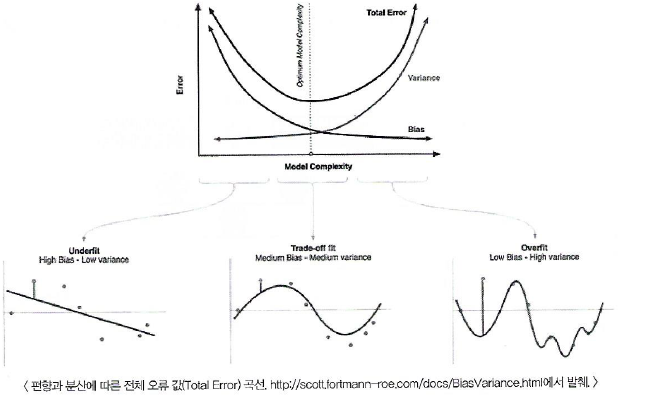


* 높은 편향/낮은 분산 --> 과소적합, 낮은 편향/높은 분산 --> 과적합되기 쉬움
* 편향과 분산이 서로 트레이드오프를 이루면서 오류 Cost값이 최대로 낮아지는 모델을 구축 --> 가장 효율적인 머신러닝 예측 모델을 만드는 방법


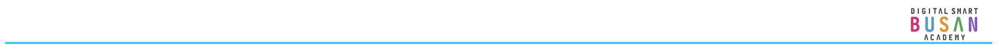

## 5-6. 규제 선형 모델(Regularized Linear Models) - 릿지(Ridge), 라쏘(Lasso), 엘라스틱넷(Elastic Net)
### 규제 선형 모델의 개요
* RSS 최소화 방법과 과적합을 방지하기 위해 회귀 계수 값이 커지지 않도록 하는 방법: 서로 균형을 이뤄야 함

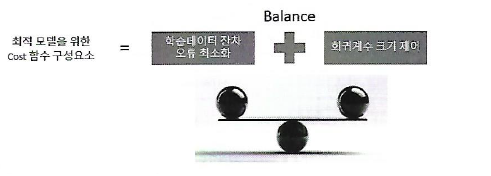

* 비용 함수 목표 = $Min(RSS(W)+alpha* \parallel W \parallel _2^2$
  * 여기서 alpha는 학습 데이터 적합 정도와 회귀 계수 값의 크기 제어를 수행하는 튜닝 파라미터

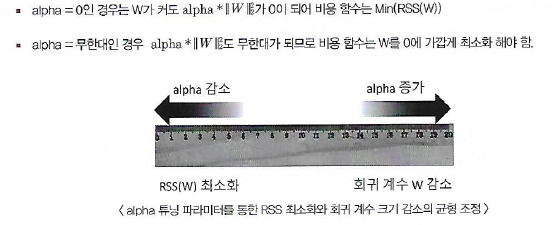

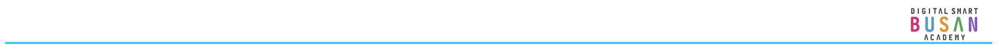

**릿지 회귀(Ridge Regression)**
* L2 규제를 선형 회귀에 적용(릿지(Ridge)회귀): $RSS(W)+\alpha*\parallel W \parallel _2^2$
* 보스턴 주택 가격을 Ridge 클래스를 이용해 다시 예측하고 예측 성능을 cross_val_score() 평가

In [ ]:
# 앞의 LinearRegression예제에서 분할한 feature 데이터 셋인 X_data과 Target 데이터 셋인 Y_target 데이터셋을 그대로 이용
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score

# boston 데이터셋 로드
bostonDF = pd.read_csv('HousingData.csv')
bostonDF=bostonDF.fillna(value=bostonDF.mean())

y_target = bostonDF['MEDV']
X_data = bostonDF.drop(['MEDV'],axis=1,inplace=False)


ridge = Ridge(alpha = 10)
neg_mse_scores = cross_val_score(ridge, X_data, y_target, scoring="neg_mean_squared_error", cv = 5)
rmse_scores  = np.sqrt(-1 * neg_mse_scores)
avg_rmse = np.mean(rmse_scores)
print(' 5 folds 의 개별 Negative MSE scores: ', np.round(neg_mse_scores, 3))
print(' 5 folds 의 개별 RMSE scores : ', np.round(rmse_scores,3))
print(' 5 folds 의 평균 RMSE : {0:.3f} '.format(avg_rmse))

 5 folds 의 개별 Negative MSE scores:  [-10.995 -22.341 -29.637 -75.295 -29.776]
 5 folds 의 개별 RMSE scores :  [3.316 4.727 5.444 8.677 5.457]
 5 folds 의 평균 RMSE : 5.524 


* 릿지의 5개 폴드 세트의 평균 RMSE가 5.518으로 규제가 없는 LinearRegression의 평균 RMSE 5.829보다 더 뛰어난 예측 성능을 보임

**alpha값을 0 , 0.1 , 1 , 10 , 100 으로 변경하면서 RMSE 측정**

In [ ]:
# Ridge에 사용될 alpha 파라미터의 값들을 정의
alphas = [0 , 0.1 , 1 , 10 , 100]

# alphas list 값을 iteration하면서 alpha에 따른 평균 rmse 구함.
for alpha in alphas :
    ridge = Ridge(alpha = alpha)

    #cross_val_score를 이용하여 5 fold의 평균 RMSE 계산
    neg_mse_scores = cross_val_score(ridge, X_data, y_target, scoring="neg_mean_squared_error", cv = 5)
    avg_rmse = np.mean(np.sqrt(-1 * neg_mse_scores))
    print('alpha {0} 일 때 5 folds 의 평균 RMSE : {1:.3f} '.format(alpha,avg_rmse))

alpha 0 일 때 5 folds 의 평균 RMSE : 5.877 
alpha 0.1 일 때 5 folds 의 평균 RMSE : 5.832 
alpha 1 일 때 5 folds 의 평균 RMSE : 5.676 
alpha 10 일 때 5 folds 의 평균 RMSE : 5.524 
alpha 100 일 때 5 folds 의 평균 RMSE : 5.390 


* alpha가 100 일 때 5 folds 의 평균 RMSE가 5.390으로 가장 좋음

**각 alpha에 따른 회귀 계수 값을 시각화. 각 alpha값 별로 plt.subplots로 맷플롯립 축 생성**

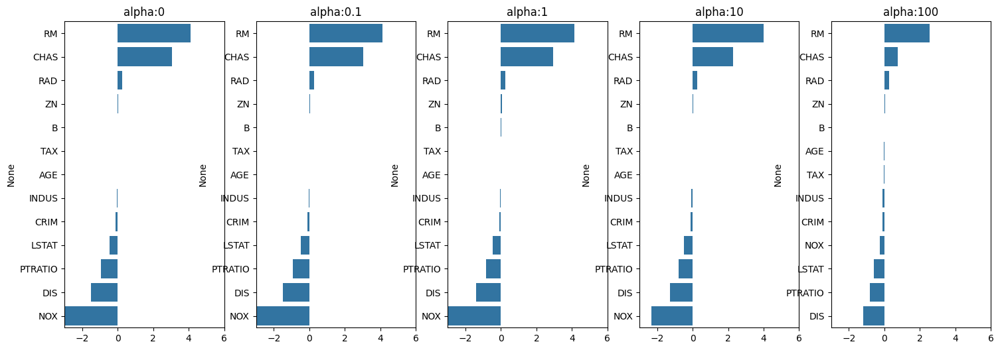

In [ ]:
# 각 alpha에 따른 회귀 계수 값을 시각화하기 위해 5개의 열로 된 맷플롯립 축 생성
fig , axs = plt.subplots(figsize=(18,6) , nrows=1 , ncols=5)
# 각 alpha에 따른 회귀 계수 값을 데이터로 저장하기 위한 DataFrame 생성
coeff_df = pd.DataFrame()

# alphas 리스트 값을 차례로 입력해 회귀 계수 값 시각화 및 데이터 저장. pos는 axis의 위치 지정
for pos , alpha in enumerate(alphas) :
    ridge = Ridge(alpha = alpha)
    ridge.fit(X_data , y_target)
    # alpha에 따른 피처별 회귀 계수를 Series로 변환하고 이를 DataFrame의 컬럼으로 추가.
    coeff = pd.Series(data=ridge.coef_ , index=X_data.columns )
    colname='alpha:'+str(alpha)
    coeff_df[colname] = coeff
    # 막대 그래프로 각 alpha 값에서의 회귀 계수를 시각화. 회귀 계수값이 높은 순으로 표현
    coeff = coeff.sort_values(ascending=False)
    axs[pos].set_title(colname)
    axs[pos].set_xlim(-3,6)
    sns.barplot(x=coeff.values , y=coeff.index, ax=axs[pos])

# for 문 바깥에서 맷플롯립의 show 호출 및 alpha에 따른 피처별 회귀 계수를 DataFrame으로 표시
plt.show()

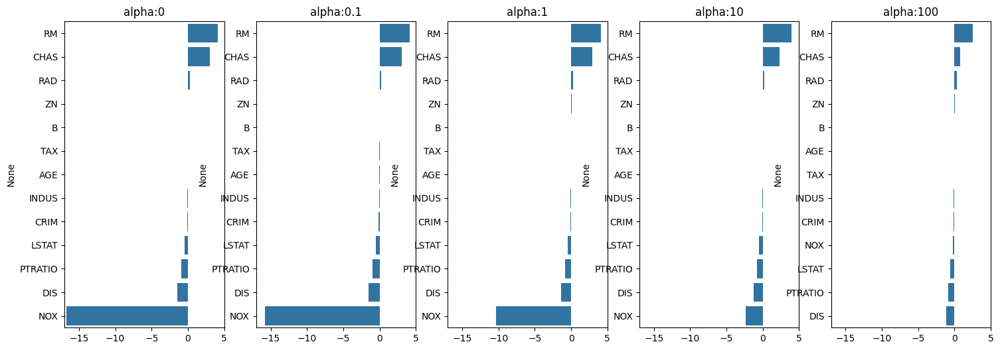

In [ ]:
#[참고] xlim(-17,5)로 했을 때
# 각 alpha에 따른 회귀 계수 값을 시각화하기 위해 5개의 열로 된 맷플롯립 축 생성
fig , axs = plt.subplots(figsize=(18,6) , nrows=1 , ncols=5)
# 각 alpha에 따른 회귀 계수 값을 데이터로 저장하기 위한 DataFrame 생성
coeff_df = pd.DataFrame()

# alphas 리스트 값을 차례로 입력해 회귀 계수 값 시각화 및 데이터 저장. pos는 axis의 위치 지정
for pos , alpha in enumerate(alphas) :
    ridge = Ridge(alpha = alpha)
    ridge.fit(X_data , y_target)
    # alpha에 따른 피처별 회귀 계수를 Series로 변환하고 이를 DataFrame의 컬럼으로 추가.
    coeff = pd.Series(data=ridge.coef_ , index=X_data.columns )
    colname='alpha:'+str(alpha)
    coeff_df[colname] = coeff
    # 막대 그래프로 각 alpha 값에서의 회귀 계수를 시각화. 회귀 계수값이 높은 순으로 표현
    coeff = coeff.sort_values(ascending=False)
    axs[pos].set_title(colname)
    axs[pos].set_xlim(-17,5)
    sns.barplot(x=coeff.values , y=coeff.index, ax=axs[pos])

# for 문 바깥에서 맷플롯립의 show 호출 및 alpha에 따른 피처별 회귀 계수를 DataFrame으로 표시
plt.show()

* 출력 결과 alpha 값은 계속 증가시킬수록 회귀 계수 값은 지속적으로 작아짐.
  * NOX 피처의 경우 alpha 값은 계속 증가시킴에 따라 회귀 계수가 크게 작아지고 있음.

**alpha 값에 따른 컬럼별 회귀계수 출력**

In [ ]:
ridge_alphas = [0 , 0.1 , 1 , 10 , 100]
sort_column = 'alpha:'+str(ridge_alphas[0])
coeff_df.sort_values(by=sort_column, ascending=False)

,alpha:0,alpha:0.1,alpha:1,alpha:10,alpha:100
RM,4.109315,4.116923,4.149592,3.996342,2.564412
CHAS,3.046846,3.033646,2.930185,2.273838,0.754487
RAD,0.268831,0.266792,0.255986,0.249394,0.289976
ZN,0.040443,0.040652,0.041856,0.044496,0.049864
B,0.009346,0.009397,0.009678,0.010029,0.009322
TAX,-0.010585,-0.010691,-0.011303,-0.012634,-0.014813
AGE,-0.010641,-0.011464,-0.015943,-0.020830,-0.010647
INDUS,-0.039237,-0.042630,-0.061351,-0.087736,-0.096892
CRIM,-0.110561,-0.110048,-0.107285,-0.104646,-0.108023
LSTAT,-0.464991,-0.466320,-0.474388,-0.500509,-0.599671


* alpha 값이 증가하면서 회귀 계수가 지속적으로 작아지고 있음. 하지만 릿지 회귀의 경우에는 회귀 계수를 0으로 만들지 않음.

In [ ]:
# Ridge에 사용될 alpha 파라미터의 값들을 정의
alphas = [0.07, 0.1, 0.5, 1, 3]

# alphas list 값을 iteration하면서 alpha에 따른 평균 rmse 구함.
for alpha in alphas :
    ridge = Ridge(alpha = alpha)

    #cross_val_score를 이용하여 5 fold의 평균 RMSE 계산
    neg_mse_scores = cross_val_score(ridge, X_data, y_target, scoring="neg_mean_squared_error", cv = 5)
    avg_rmse = np.mean(np.sqrt(-1 * neg_mse_scores))
    print('alpha {0} 일 때 5 folds 의 평균 RMSE : {1:.3f} '.format(alpha,avg_rmse))

alpha 0.07 일 때 5 folds 의 평균 RMSE : 5.844 
alpha 0.1 일 때 5 folds 의 평균 RMSE : 5.832 
alpha 0.5 일 때 5 folds 의 평균 RMSE : 5.732 
alpha 1 일 때 5 folds 의 평균 RMSE : 5.676 
alpha 3 일 때 5 folds 의 평균 RMSE : 5.599 


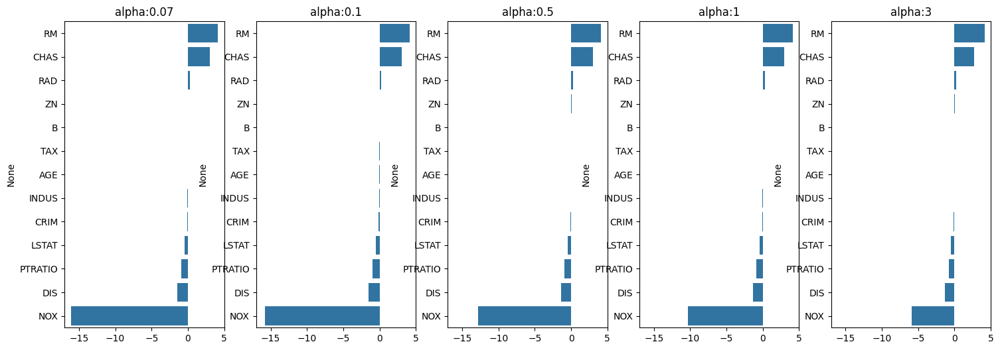

In [ ]:
# 각 alpha에 따른 회귀 계수 값을 시각화하기 위해 5개의 열로 된 맷플롯립 축 생성
fig , axs = plt.subplots(figsize=(18,6) , nrows=1 , ncols=5)
# 각 alpha에 따른 회귀 계수 값을 데이터로 저장하기 위한 DataFrame 생성
coeff_df = pd.DataFrame()

# alphas 리스트 값을 차례로 입력해 회귀 계수 값 시각화 및 데이터 저장. pos는 axis의 위치 지정
for pos , alpha in enumerate(alphas) :
    ridge = Ridge(alpha = alpha)
    ridge.fit(X_data , y_target)
    # alpha에 따른 피처별 회귀 계수를 Series로 변환하고 이를 DataFrame의 컬럼으로 추가.
    coeff = pd.Series(data=ridge.coef_ , index=X_data.columns )
    colname='alpha:'+str(alpha)
    coeff_df[colname] = coeff
    # 막대 그래프로 각 alpha 값에서의 회귀 계수를 시각화. 회귀 계수값이 높은 순으로 표현
    coeff = coeff.sort_values(ascending=False)
    axs[pos].set_title(colname)
    axs[pos].set_xlim(-17,5)
    sns.barplot(x=coeff.values , y=coeff.index, ax=axs[pos])

# for 문 바깥에서 맷플롯립의 show 호출 및 alpha에 따른 피처별 회귀 계수를 DataFrame으로 표시
plt.show()

In [ ]:
ridge_alphas = [0.07, 0.1, 0.5, 1, 3]
sort_column = 'alpha:'+str(ridge_alphas[0])
coeff_df.sort_values(by=sort_column, ascending=False)

,alpha:0.07,alpha:0.1,alpha:0.5,alpha:1,alpha:3
RM,4.114770,4.116923,4.137503,4.149592,4.142254
CHAS,3.037554,3.033646,2.984928,2.930185,2.744773
RAD,0.267377,0.266792,0.260712,0.255986,0.248814
ZN,0.040592,0.040652,0.041302,0.041856,0.042999
B,0.009382,0.009397,0.009552,0.009678,0.009901
TAX,-0.010660,-0.010691,-0.011021,-0.011303,-0.011888
AGE,-0.011228,-0.011464,-0.013950,-0.015943,-0.019330
INDUS,-0.041655,-0.042630,-0.052952,-0.061351,-0.076470
CRIM,-0.110195,-0.110048,-0.108506,-0.107285,-0.105287
LSTAT,-0.465935,-0.466320,-0.470567,-0.474388,-0.483494


**라쏘 회귀(Lasso Regression)**

* L1 규제를 선형 회귀에 적용(라쏘(Lass0)회귀): $RSS(W)+alpha*\parallel W \parallel _1$
* get_linear_reg_eval() 함수를 구현- 모델명 'Lassso'로 입력
* alpha 값 [0.07, 0.1, 0.5, 1, 3]

In [ ]:
from sklearn.linear_model import Lasso, ElasticNet

# alpha값에 따른 회귀 모델의 폴드 평균 RMSE를 출력하고 회귀 계수값들을 DataFrame으로 반환
def get_linear_reg_eval(model_name, params=None, X_data_n=None, y_target_n=None,
                        verbose=True, return_coeff=True):
    coeff_df = pd.DataFrame()
    if verbose : print('####### ', model_name , '#######')
    for param in params:
        if model_name =='Ridge': model = Ridge(alpha=param)
        elif model_name =='Lasso': model = Lasso(alpha=param)
        elif model_name =='ElasticNet': model = ElasticNet(alpha=param, l1_ratio=0.7)
        neg_mse_scores = cross_val_score(model, X_data_n,
                                             y_target_n, scoring="neg_mean_squared_error", cv = 5)
        avg_rmse = np.mean(np.sqrt(-1 * neg_mse_scores))
        print('alpha {0}일 때 5 폴드 세트의 평균 RMSE: {1:.3f} '.format(param, avg_rmse))
        # cross_val_score는 evaluation metric만 반환하므로 모델을 다시 학습하여 회귀 계수 추출

        model.fit(X_data_n , y_target_n)
        if return_coeff:
            # alpha에 따른 피처별 회귀 계수를 Series로 변환하고 이를 DataFrame의 컬럼으로 추가.
            coeff = pd.Series(data=model.coef_ , index=X_data_n.columns )
            colname='alpha:'+str(param)
            coeff_df[colname] = coeff

    return coeff_df
# end of get_linear_regre_eval

In [ ]:
# 라쏘에 사용될 alpha 파라미터의 값들을 정의하고 get_linear_reg_eval() 함수 호출
lasso_alphas = [ 0.07, 0.1, 0.5, 1, 3]
coeff_lasso_df =get_linear_reg_eval('Lasso', params=lasso_alphas, X_data_n=X_data, y_target_n=y_target)

#######  Lasso #######
alpha 0.07일 때 5 폴드 세트의 평균 RMSE: 5.617 
alpha 0.1일 때 5 폴드 세트의 평균 RMSE: 5.618 
alpha 0.5일 때 5 폴드 세트의 평균 RMSE: 5.719 
alpha 1일 때 5 폴드 세트의 평균 RMSE: 5.871 
alpha 3일 때 5 폴드 세트의 평균 RMSE: 6.333 


* alpha가 0.07일 때 5.612로 가장 좋은 평균 RMSE를 보임
  * 릿지 평균 5.5118보다 약간 떨어지는 수치지만 LinearRegression 평균인 5.829보다 향상

In [ ]:
print(lasso_alphas)

[0.07, 0.1, 0.5, 1, 3]


In [ ]:
# 반환된 coeff_lasso_df를 첫번째 컬럼순으로 내림차순 정렬하여 회귀계수 DataFrame출력
sort_column = 'alpha:'+str(lasso_alphas[0])
coeff_lasso_df.sort_values(by=sort_column, ascending=False)

,alpha:0.07,alpha:0.1,alpha:0.5,alpha:1,alpha:3
RM,4.108515,4.033217,2.887879,1.443005,0.000000
CHAS,1.856413,1.371317,0.000000,0.000000,0.000000
RAD,0.240216,0.243983,0.249490,0.239985,0.052262
ZN,0.044090,0.044208,0.045299,0.045527,0.035809
B,0.010246,0.010256,0.009486,0.008301,0.006181
NOX,-0.000000,-0.000000,-0.000000,-0.000000,0.000000
TAX,-0.012919,-0.013198,-0.014338,-0.014771,-0.009113
AGE,-0.021985,-0.020643,-0.006120,0.004084,0.027083
INDUS,-0.085477,-0.080200,-0.047588,-0.017351,-0.000000
CRIM,-0.101291,-0.101255,-0.089910,-0.071922,-0.000000


* alpha 값에 따른 피처별 회귀 계수 출력 결과   alpha의 크기가 증가함에 따라 일부 피처의 회귀 계수는 0으로 바뀜
  * NOX 속성은 alpha가 0.07일 때부터 회귀 계수가 0, alpha를 증가시키면서 INDUS, CHAS와 같은 속성의 회귀 계수가 0으로 바뀜
  * 회귀 계수가 0인 피처는 회귀 식에서 제외되면서 피처 선택의 효과를 얻을 수 있음.

**엘라스틱넷(Elastic Net) 회귀**
* L2 규제와 L1 규제를 결합한 회귀
* 엘라스틱넷 회귀 비용함수의 목표 $RSS(W)+alpha2*\parallel W \parallel _2^2+alpha1*\parallel W \parallel _1$ 식을 최소화하는 $W$를 찾는 것

In [ ]:
# 엘라스틱넷에 사용될 alpha 파라미터의 값들을 정의하고 get_linear_reg_eval() 함수 호출
# l1_ratio는 0.7로 고정
elastic_alphas = [ 0.07, 0.1, 0.5, 1, 3]
coeff_elastic_df =get_linear_reg_eval('ElasticNet', params=elastic_alphas,
                                      X_data_n=X_data, y_target_n=y_target)

#######  ElasticNet #######
alpha 0.07일 때 5 폴드 세트의 평균 RMSE: 5.550 
alpha 0.1일 때 5 폴드 세트의 평균 RMSE: 5.539 
alpha 0.5일 때 5 폴드 세트의 평균 RMSE: 5.534 
alpha 1일 때 5 폴드 세트의 평균 RMSE: 5.688 
alpha 3일 때 5 폴드 세트의 평균 RMSE: 6.216 


* alpha 0.5일 때 평균 RMSE가 5.467로 가장 좋은 예측 성능을 보임.

In [ ]:
# 반환된 coeff_elastic_df를 첫번째 컬럼순으로 내림차순 정렬하여 회귀계수 DataFrame출력
sort_column = 'alpha:'+str(elastic_alphas[0])
coeff_elastic_df.sort_values(by=sort_column, ascending=False)

,alpha:0.07,alpha:0.1,alpha:0.5,alpha:1,alpha:3
RM,3.882183,3.724320,2.186515,1.161957,0.000000
CHAS,1.650652,1.269528,0.000000,0.000000,0.000000
RAD,0.249265,0.254326,0.275877,0.266011,0.142799
ZN,0.045155,0.045673,0.048881,0.048547,0.039144
B,0.010122,0.010068,0.009039,0.008164,0.006657
TAX,-0.013224,-0.013541,-0.015083,-0.015364,-0.012154
AGE,-0.020594,-0.019048,-0.003051,0.005619,0.026478
INDUS,-0.088208,-0.085960,-0.067198,-0.042306,-0.000000
CRIM,-0.103026,-0.103166,-0.096395,-0.082801,-0.030120
NOX,-0.141308,-0.000000,-0.000000,-0.000000,-0.000000


* alpha값에 따른 피처들의 회귀 계수들 값이 라쏘보다는 상대적으로 0이 되는 값이 적음을 알 수 있음

**선형 회귀 모델을 위한 데이터 변환**
* 피처 데이터 세트와 타깃 데이터 세트에 스케일링/정규화 작업
  1. StadardScaler클래스를 이용해 평균이 0, 분산이 1인 표준 정규 분포를 가진 데이터 세트로 변환. MinMaxScaler 클래스를 이용해 최솟값이 0이고 최댓값이 1인 값으로 정규화를 수행
  2. 스케일링/정규화를 수행한 데이터 세트에 다시 다항 특성을 적용하여 변환하는 방법
  3. 로그 변환

* 보스턴 주택가격 피처 데이터 세트에 표준 정규 분포 변환, 최댓값/최솟값 정규화, 로그 변환을 차례로 적용한 후 RMSE로 예측 성능 측정

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures

# method는 표준 정규 분포 변환(Standard), 최대값/최소값 정규화(MinMax), 로그변환(Log) 결정
# p_degree는 다향식 특성을 추가할 때 적용. p_degree는 2이상 부여하지 않음.
def get_scaled_data(method='None', p_degree=None, input_data=None):
    if method == 'Standard':
        scaled_data = StandardScaler().fit_transform(input_data)
    elif method == 'MinMax':
        scaled_data = MinMaxScaler().fit_transform(input_data)
    elif method == 'Log':
        scaled_data = np.log1p(input_data)
    else:
        scaled_data = input_data

    if p_degree != None:
        scaled_data = PolynomialFeatures(degree=p_degree,
                                         include_bias=False).fit_transform(scaled_data)

    return scaled_data

In [ ]:
# Ridge의 alpha값을 다르게 적용하고 다양한 데이터 변환방법에 따른 RMSE 추출.
alphas = [0.1, 1, 10, 100]
# 변환 방법은 모두 6개, 원본 그대로, 표준정규분포, 표준정규분포+다항식 특성
# 최대/최소 정규화, 최대/최소 정규화+다항식 특성, 로그변환
scale_methods=[(None, None), ('Standard', None), ('Standard', 2),
               ('MinMax', None), ('MinMax', 2), ('Log', None)]
for scale_method in scale_methods:
    X_data_scaled = get_scaled_data(method=scale_method[0], p_degree=scale_method[1],
                                    input_data=X_data)
    print(X_data_scaled.shape, X_data.shape)
    print('\n## 변환 유형:{0}, Polynomial Degree:{1}'.format(scale_method[0], scale_method[1]))
    get_linear_reg_eval('Ridge', params=alphas, X_data_n=X_data_scaled,
                        y_target_n=y_target, verbose=False, return_coeff=False)

(506, 13) (506, 13)

## 변환 유형:None, Polynomial Degree:None
alpha 0.1일 때 5 폴드 세트의 평균 RMSE: 5.832 
alpha 1일 때 5 폴드 세트의 평균 RMSE: 5.676 
alpha 10일 때 5 폴드 세트의 평균 RMSE: 5.524 
alpha 100일 때 5 폴드 세트의 평균 RMSE: 5.390 
(506, 13) (506, 13)

## 변환 유형:Standard, Polynomial Degree:None
alpha 0.1일 때 5 폴드 세트의 평균 RMSE: 5.874 
alpha 1일 때 5 폴드 세트의 평균 RMSE: 5.851 
alpha 10일 때 5 폴드 세트의 평균 RMSE: 5.683 
alpha 100일 때 5 폴드 세트의 평균 RMSE: 5.463 
(506, 104) (506, 13)

## 변환 유형:Standard, Polynomial Degree:2
alpha 0.1일 때 5 폴드 세트의 평균 RMSE: 10.988 
alpha 1일 때 5 폴드 세트의 평균 RMSE: 7.632 
alpha 10일 때 5 폴드 세트의 평균 RMSE: 5.650 
alpha 100일 때 5 폴드 세트의 평균 RMSE: 4.684 
(506, 13) (506, 13)

## 변환 유형:MinMax, Polynomial Degree:None
alpha 0.1일 때 5 폴드 세트의 평균 RMSE: 5.813 
alpha 1일 때 5 폴드 세트의 평균 RMSE: 5.522 
alpha 10일 때 5 폴드 세트의 평균 RMSE: 5.798 
alpha 100일 때 5 폴드 세트의 평균 RMSE: 7.648 
(506, 104) (506, 13)

## 변환 유형:MinMax, Polynomial Degree:2
alpha 0.1일 때 5 폴드 세트의 평균 RMSE: 5.467 
alpha 1일 때 5 폴드 세트의 평균 RMSE: 4.425 
alpha 10일 때 5 폴드 세트의 평균 RM

|변환 유형|alpha=0.1|alpha=1|alpha=10|alpha=100|
|-----|-----|-----|-----|-----|
|원본 데이터|5.788|5.653|5.518|5.330|
|표준 정규 분포|5.826|5.803|5.637|5.421|
|표준 정규 분포+ 2차 다항식|8.827|6.871|5.485|**4.634**|
|최솟값/최댓값 정규화|5.764|5.465|5.754|7.635|
|최솟값/최댓값 정규화+ 2차 다항식|5.298|**4.323**|5.185|6.538|
|로그 변환|**4.770**|**4.676**|**4.836**|6.241|

* 표준 정규 분포+ 2차 다항식 변환: alpha=100에서 4.634로 성능 개선
* 최솟값/최댓값 정규화+ 2차 다항식 변환: alpha=1에서 4.323로 성능 개선
* 로그 변환: alpha가 0.1, 1, 10인 경우에 모두 좋은 성능 향상

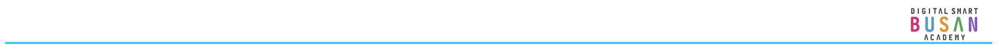

## 5.7 로지스틱 회귀
* 로지스틱 회귀가 선형 회귀와 다른 점은 학습을 통해 선형 함수의 회귀 최적선을 찾는 것이 아니라 시그모이드(Sigmoid) 함수 최적선을 찾고 시그모이드 함수 $y={{1}\over{1+e^{-x}}}$의 반환 값을 확률로 간주해 확률에 따라 분류를 결정

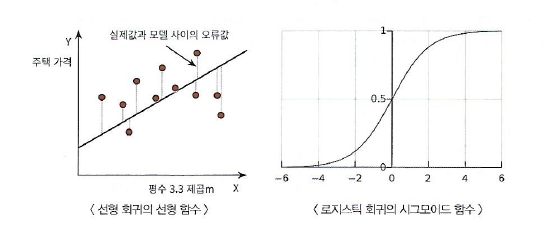

* 시그모이드 함수는 $x$ 값이 +, -로 아무리 커지거나 작아져도 $y$ 값은 항상 0과 1사이 값을 반환
  * $x$ 값이 커지면 1에 근사, $x$ 값이 작아지면 0에 근사, $x$ 값이 0일 때 0.5


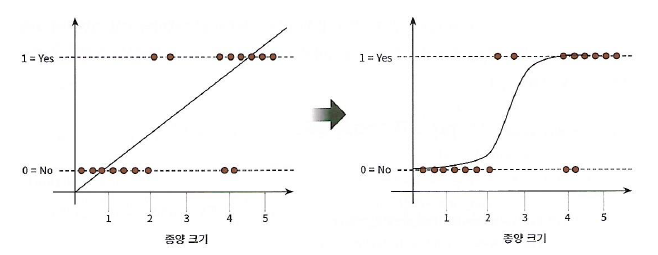

* 사이킷런은 로지스틱 회귀를 위해서 LogisticRegression 클래스를 제공
  * LogisticRegression 클래스에서 solver 파리미터의 다음 값을 적용해서 최적화를 선택할 수 있다. (https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)


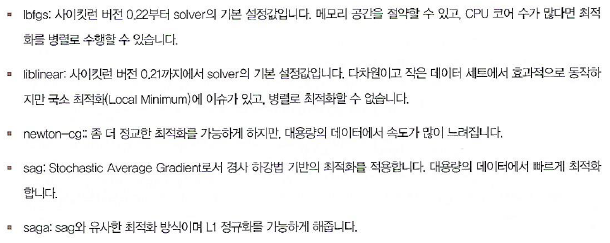

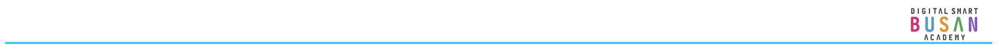

* 사이킷런의 LogisticRegression 클래스를 이용하여 위스콘신 유방암 데이터 세트(load_brest_cancer() 호출) 기반에서 로지스틱 회귀로 암 여부를 판단

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.datasets import load_breast_cancer
from sklearn.linear_model import LogisticRegression

# load_brest_cancer() 호출해 전체 데이터 세트를 생성
cancer = load_breast_cancer()

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# StandardScaler( )로 평균이 0, 분산 1로 데이터 분포도 변환
scaler = StandardScaler()
data_scaled = scaler.fit_transform(cancer.data)

# train_test_split()을 이용해 데이터 세트를 분리
X_train , X_test, y_train , y_test = train_test_split(data_scaled, cancer.target, test_size=0.3, random_state=0)

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score

# 로지스틱 회귀를 이용하여 학습 및 예측 수행.
lr_clf = LogisticRegression()
lr_clf.fit(X_train, y_train)
lr_preds = lr_clf.predict(X_test)

# accuracy와 roc_auc 측정(기본 solver 값은 'lbfgs')
print('accuracy: {:0.3f}'.format(accuracy_score(y_test, lr_preds)))
print('roc_auc: {:0.3f}'.format(roc_auc_score(y_test , lr_preds)))

accuracy: 0.977
roc_auc: 0.972


In [ ]:
solvers=['lbfgs', 'liblinear', 'newton-cg', 'sag', 'saga']

# 여러 개의 solver 값별로 LogisticRegression 학습 후 성능 평가
for solver in solvers:
  lr_clf=LogisticRegression(solver=solver, max_iter=600) #max_iter=600이면 최적화 알고지즘이 수렴할 때까지 최대 600번 반복하여 회귀 계수를 최적화
  lr_clf.fit(X_train, y_train)
  lr_preds=lr_clf.predict(X_test)

  # accuracy와 roc_auc 측정
  print('solver:{0}, accuracy: {1:.3f}. roc_auc: {2:.3f}'.format(solver,
                                                                  accuracy_score(y_test , lr_preds),
                                                                  roc_auc_score(y_test , lr_preds)))

solver:lbfgs, accuracy: 0.977. roc_auc: 0.972
solver:liblinear, accuracy: 0.982. roc_auc: 0.979
solver:newton-cg, accuracy: 0.977. roc_auc: 0.972
solver:sag, accuracy: 0.982. roc_auc: 0.979
solver:saga, accuracy: 0.982. roc_auc: 0.979


* 'liblinear'와 'sag', 'saga'일 경우에 정확도가 0.982, RO-AUC가 0.979로 'lbfgs'나 'newton-cg' 대비하여 상대적인 성능 수치가 약간 높지만 데이터 세트가 워낙 작기 때문에 개별 solver 별 차이가 크지 않다.

In [ ]:
# GridSearchCV를 이용해 위스콘신 데이터 세트에서 solver, penalty, C를 최적화
from sklearn.model_selection import GridSearchCV

params={'penalty':['l2', 'l1'],
        'C':[0.01, 0.1, 1, 5, 10]}

grid_clf = GridSearchCV(lr_clf, param_grid=params, scoring='accuracy', cv=3 )
grid_clf.fit(data_scaled, cancer.target)
print('최적 하이퍼 파라미터:{0}, 최적 평균 정확도:{1:.3f}'.format(grid_clf.best_params_,
                                                  grid_clf.best_score_))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

최적 하이퍼 파라미터:{'C': 0.1, 'penalty': 'l2'}, 최적 평균 정확도:0.974


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


* solver가 liblinear, Penalty가 L2규제, C값은 0.1일 때, 평균 정확도가 0.979로 가장 좋은 성능
* FitFailedWarning 메시지: solver가 lbfgs일 때 L1 규제를 지원하지 않음에도 GridSearchCV에서 L1 규제값을 입력했기 때문에 나오는 메시지

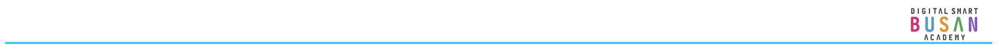

## 5.8 회귀 트리

* 피처가 단 하나인 X 피터 데이터 세트와 결정값 Y가 2차원 평면상 다음 그림과 같이 있다고 가정

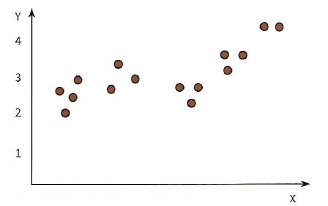

* 데이터 세트의 X 피처를 결정 트리 기반으로 분할하면 X 값의 균일도를 반영한 지니 계수에 따라 분할할 수 있다.

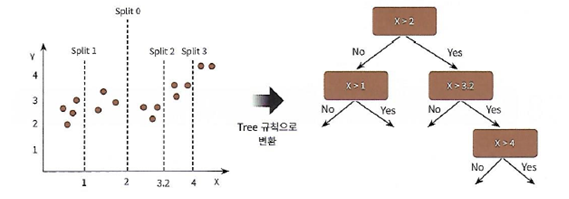

* 리프 노드 생성 기준에 부합하는 트리 분할 완료 --> 리프 노드에 소속된 데이터 값의 평균값을 구해서 최종적으로 리프 노드에 결정 값으로 할당

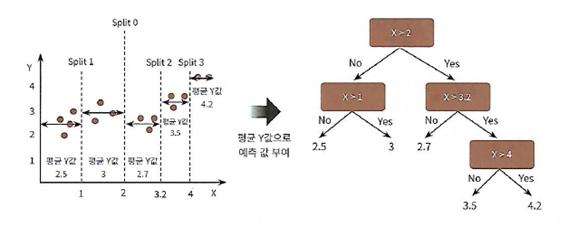

* 사이킷런의 트리 기반 회귀와 분류의 Estimator 클래스

|알고리즘|회귀 Estimator 클래스| 분류 Estimator 클래스|
|-----|-----|-----|
|Decision Tree|DecisionTreeRegressor|DecisionTreeClassifier|
|Gradient Boosting|GradientBoostingRegressor|GradientBoostingClassifier|
|XGBoost|XGBRegressor|XGBClassifier|
|LightGBM|LGBMRegressor|LGBMClassifier|


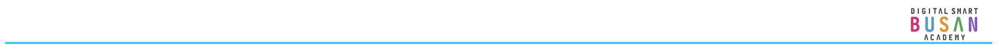

* 회귀 트리 개요
1. scikit-learn의 결정 트리와 결정 트리 기반의 앙상블 알고리즘은 분류 말고 회귀도 가능함

2. 트리가 CART (Classification and Regression Tree)를 기반으로 만들어졌기 때문

3. CART 회귀 트리는 분류와 유사하게 분할, 최종 분할이 완료된 후에 각 분할 영역에 있는 데이터 결정값들의 평균 값으로 학습/예측

4. 회귀 트리 역시 복잡한 트리 구조를 가질 경우 과적합이 위험이 있고, 트리의 크기와 노드의 개수의 제한 등으로 개선 가능

**사이킷런의 랜덤 포레스트 회귀 트리인 RandomForestRegressor를 이용해 보스턴 주택 가격 예측**

In [1]:
# from sklearn.datasets import load_boston
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import numpy as np

# boston 데이터셋 로드
bostonDF = pd.read_csv('HousingData.csv')
bostonDF=bostonDF.fillna(value=bostonDF.mean())

y_target = bostonDF['MEDV']
X_data = bostonDF.drop(['MEDV'], axis=1,inplace=False)

rf = RandomForestRegressor(random_state=0, n_estimators=1000)
neg_mse_scores = cross_val_score(rf, X_data, y_target, scoring="neg_mean_squared_error", cv = 5)
rmse_scores  = np.sqrt(-1 * neg_mse_scores)
avg_rmse = np.mean(rmse_scores)

print(' 5 교차 검증의 개별 Negative MSE scores: ', np.round(neg_mse_scores, 2))
print(' 5 교차 검증의 개별 RMSE scores : ', np.round(rmse_scores, 2))
print(' 5 교차 검증의 평균 RMSE : {0:.3f} '.format(avg_rmse))

 5 교차 검증의 개별 Negative MSE scores:  [ -8.21 -13.27 -24.9  -48.88 -16.74]
 5 교차 검증의 개별 RMSE scores :  [2.86 3.64 4.99 6.99 4.09]
 5 교차 검증의 평균 RMSE : 4.516 


**결정트리, GBM, XGBoost, LightGBM의 Regressor를 모두 이용해 보스턴 주택 가격 예측**

* get_model_cv_prediction()함수: 입력 모델과 데이터 세트를 입력받아 교차 검증으로 평균 RMSE를 계산해주는 함수

In [5]:
def get_model_cv_prediction(model, X_data, y_target):
    neg_mse_scores = cross_val_score(model, X_data, y_target, scoring="neg_mean_squared_error", cv = 5)
    rmse_scores  = np.sqrt(-1 * neg_mse_scores)
    avg_rmse = np.mean(rmse_scores)
    print('##### ',model.__class__.__name__ , ' #####')
    print(' 5 교차 검증의 평균 RMSE : {0:.3f} '.format(avg_rmse))

In [6]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

dt_reg = DecisionTreeRegressor(random_state=0, max_depth=4)
rf_reg = RandomForestRegressor(random_state=0, n_estimators=1000)
gb_reg = GradientBoostingRegressor(random_state=0, n_estimators=1000)
xgb_reg = XGBRegressor(n_estimators=1000)
lgb_reg = LGBMRegressor(n_estimators=1000)

# 트리 기반의 회귀 모델을 반복하면서 평가 수행
models = [dt_reg, rf_reg, gb_reg, xgb_reg, lgb_reg]
for model in models:
    get_model_cv_prediction(model, X_data, y_target)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

* [참고] 결과 확인을 위해 먼저 DecisionTreeRegressor,GradientBoostingRegressor, XGBRegressor 확인후 LGBMRegressor를 확인

In [7]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

dt_reg = DecisionTreeRegressor(random_state=0, max_depth=4)
rf_reg = RandomForestRegressor(random_state=0, n_estimators=1000)
gb_reg = GradientBoostingRegressor(random_state=0, n_estimators=1000)
xgb_reg = XGBRegressor(n_estimators=1000)
lgb_reg = LGBMRegressor(n_estimators=1000)

# 트리 기반의 회귀 모델을 반복하면서 평가 수행
models = [dt_reg, rf_reg, gb_reg, xgb_reg]
for model in models:
    get_model_cv_prediction(model, X_data, y_target)

#####  DecisionTreeRegressor  #####
 5 교차 검증의 평균 RMSE : 6.055 
#####  RandomForestRegressor  #####
 5 교차 검증의 평균 RMSE : 4.516 
#####  GradientBoostingRegressor  #####
 5 교차 검증의 평균 RMSE : 4.312 
#####  XGBRegressor  #####
 5 교차 검증의 평균 RMSE : 4.927 


In [8]:
#lgb_reg = LGBMRegressor(n_estimators=1000)
get_model_cv_prediction(lgb_reg, X_data, y_target)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

※최적 하이퍼 파라미터를 튜닝한 것은 아니므로 최적화된 값은 아님 !

**feature_importances_를 이용해 보스턴 주택 가격 모델의 피처별 중요도를 시각화**

<Axes: xlabel='None', ylabel='None'>

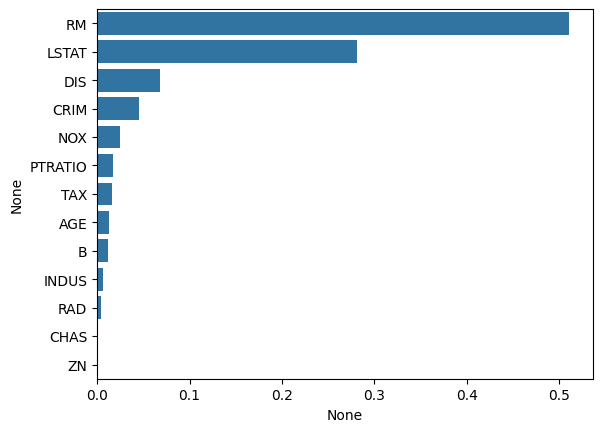

In [9]:
import seaborn as sns
%matplotlib inline

rf_reg = RandomForestRegressor(n_estimators=1000)

# 앞 예제에서 만들어진 X_data, y_target 데이터 셋을 적용하여 학습합니다.
rf_reg.fit(X_data, y_target)

feature_series = pd.Series(data=rf_reg.feature_importances_, index=X_data.columns )
feature_series = feature_series.sort_values(ascending=False)
sns.barplot(x= feature_series, y=feature_series.index)

**보스턴 데이터 세트의 개수를 100개만 샘플링하고 독립변수 RM, 종속변수 MEDV 예측값을 시각화**

(100, 2)


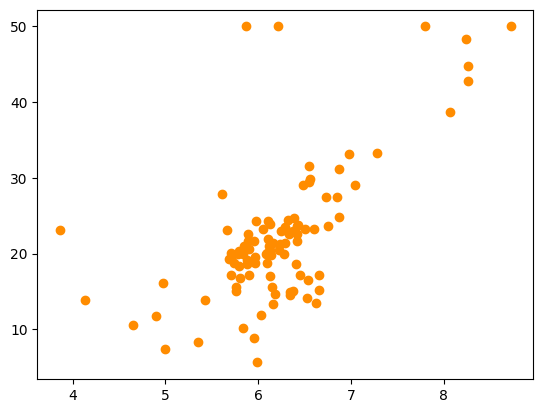

In [10]:
import matplotlib.pyplot as plt
%matplotlib inline

bostonDF_sample = bostonDF[['RM','MEDV']]
bostonDF_sample = bostonDF_sample.sample(n=100,random_state=0)
print(bostonDF_sample.shape)
plt.figure()
plt.scatter(bostonDF_sample.RM , bostonDF_sample.MEDV,c="darkorange")

* max_depth를 2,7로 해서 학습

**보스턴 데이터 세트에 대해 LinearRegression나 DecisionTreeRegressor의 max_depth는 각각 2, 7로 해서 학습**
* Regressor에 RM 값을 4.5 ~ 8.5 까지 100개 데이터 세트로 예측값

In [11]:
import numpy as np
from sklearn.linear_model import LinearRegression

# 선형 회귀와 결정 트리 기반의 Regressor 생성. DecisionTreeRegressor의 max_depth는 각각 2, 7
lr_reg = LinearRegression()
rf_reg2 = DecisionTreeRegressor(max_depth=2)
rf_reg7 = DecisionTreeRegressor(max_depth=7)

# 실제 예측을 적용할 테스트용 데이터 셋을 4.5 ~ 8.5 까지 100개 데이터 셋 생성.
X_test = np.arange(4.5, 8.5, 0.04).reshape(-1, 1)

# 보스턴 주택가격 데이터에서 시각화를 위해 피처는 RM만, 그리고 결정 데이터인 PRICE 추출
X_feature = bostonDF_sample['RM'].values.reshape(-1,1)
y_target = bostonDF_sample['MEDV'].values.reshape(-1,1)

# 학습과 예측 수행.
lr_reg.fit(X_feature, y_target)
rf_reg2.fit(X_feature, y_target)
rf_reg7.fit(X_feature, y_target)

pred_lr = lr_reg.predict(X_test)
pred_rf2 = rf_reg2.predict(X_test)
pred_rf7 = rf_reg7.predict(X_test)

* LinearRegression과 DecisionTreeRegressor의 max_depth를 각각 2, 7로 해서 학습된 Regressor에서 예측한 MEDV 회귀선을 그림

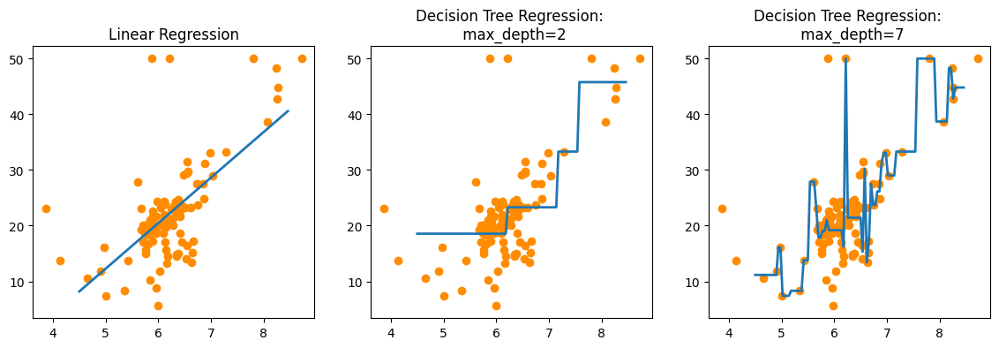

In [12]:
fig , (ax1, ax2, ax3) = plt.subplots(figsize=(14,4), ncols=3)

# X축값을 4.5 ~ 8.5로 변환하며 입력했을 때, 선형 회귀와 결정 트리 회귀 예측 선 시각화
# 선형 회귀로 학습된 모델 회귀 예측선
ax1.set_title('Linear Regression')
ax1.scatter(bostonDF_sample.RM, bostonDF_sample.MEDV , c="darkorange")
ax1.plot(X_test, pred_lr,label="linear", linewidth=2 )

# DecisionTreeRegressor의 max_depth를 2로 했을 때 회귀 예측선
ax2.set_title('Decision Tree Regression: \n max_depth=2')
ax2.scatter(bostonDF_sample.RM, bostonDF_sample.MEDV , c="darkorange")
ax2.plot(X_test, pred_rf2, label="max_depth:2", linewidth=2 )

# DecisionTreeRegressor의 max_depth를 7로 했을 때 회귀 예측선
ax3.set_title('Decision Tree Regression: \n max_depth=7')
ax3.scatter(bostonDF_sample.RM, bostonDF_sample.MEDV , c="darkorange")
ax3.plot(X_test, pred_rf7, label="max_depth:7", linewidth=2)

* 선형회귀는 직선 형태이지만 회귀 트리의 경우 분할되는 데이터 지점에 따라 브랜치를 만들며 계단 형태로 회귀선 만듦
* DecisionTreeRegressor의 max_depth=7인 경우에는 학습 데이터 세트의 이상치(ourlier) 데이터도 학습하면서 복잡한 계단 형태의 회귀선을 만들어 과적합이 되기 쉬운 모델이 되었음(오버피팅)
  * 오버피팅의 경우 트리 크기, 노드 개수 제한 등으로 개선 가능


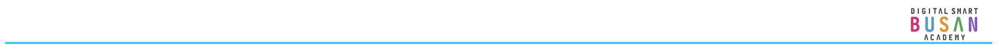

## 5.9 회귀 실습 - 자전거 대여 수요(Bike Sharing Demand) 예측
* 캐글의 자전거 대여 수요(Bike Sharing Demand) 예측 경연에서 사용된 학습 데이터 세트를 이용 선형 회귀와 트리 기반 회귀를 비교
  * 데이터 세트 https://www.kaggle.com/c/bike-sharing-demand/data

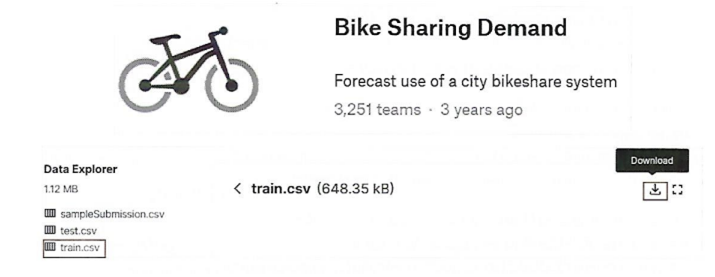

* 데이터 세트의 주요 칼럼
  * datetime: hourly date+timestamp (YYYY-MM-DD 00:00:00)
  * season	봄(1) 여름(2) 가을(3) 겨울(4)
  * holiday	공휴일(1) 그외(0)
  * workingday	근무일(1) 그외(0)
  * weather	아주깨끗한날씨(1) 약간의 안개와 구름(2) 약간의 눈,비(3) 아주많은비와 우박(4)
  * temp	온도(섭씨로 주어짐)
  * atemp	체감온도(섭씨로 주어짐)
  * humidity	습도
  * windspeed	풍속
  * casual	비회원의 자전거 대여량
  * registered	회원의 자전거 대여량
  * count	총 자전거 대여량 (비회원+회원)


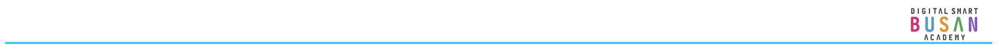

### 데이터 클렌징 및 가공

In [13]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

bike_df = pd.read_csv('bike_train.csv')
print(bike_df.shape)
bike_df.head(3)

(10886, 12)


,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32


In [14]:
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


* datatime 칼럼만 object형

In [15]:
# 문자열을 datetime 타입으로 변경.
bike_df['datetime'] = bike_df.datetime.apply(pd.to_datetime)

# datetime 타입에서 년, 월, 일, 시간 추출
bike_df['year'] = bike_df.datetime.apply(lambda x : x.year)
bike_df['month'] = bike_df.datetime.apply(lambda x : x.month)
bike_df['day'] = bike_df.datetime.apply(lambda x : x.day)
bike_df['hour'] = bike_df.datetime.apply(lambda x: x.hour)
bike_df.head(3)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,year,month,day,hour
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16,2011,1,1,0
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40,2011,1,1,1
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32,2011,1,1,2


* 새롭게 year,	month,	day,	hour 칼럼이 추가 --> datetime 칼럼 삭제
* count=casual(사전에 등록하지 않은 사용자의 자전거 대여 횟수)+registered(사전에 등록한 사용자의 자전거 대여 횟수)이므로 --> casual, registered 칼럼 삭제(상관도가 높아 예측을 저해할 우려 있음)

In [16]:
drop_columns = [ 'datetime','casual','registered'] # Remove 'datetime' as it's already split into other columns
bike_df.drop(drop_columns, axis=1,inplace=True)

* 주요 칼럼별('year', 'month', 'season', 'weather', 'day', 'hour', 'holiday', 'workingday')로 Target 값인 count(대여 횟수) 분포 barplot으로 시각화(2개의 행과 4개의 열)

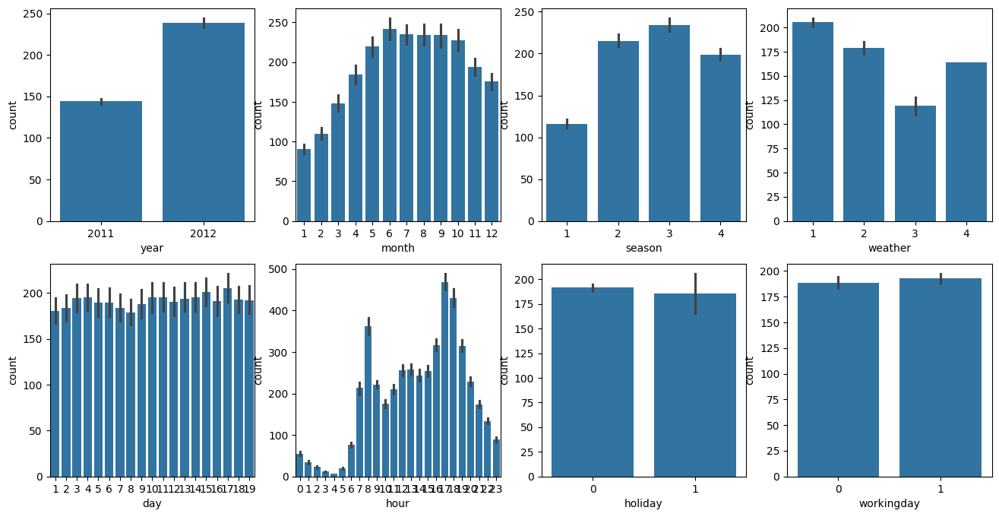

In [17]:
fig, axs=plt.subplots(figsize=(16,8), ncols=4, nrows=2)
cat_features=['year','month', 'season', 'weather', 'day', 'hour', 'holiday', 'workingday']
# cat_features에 있는 모든 칼럼별로 개별 칼럼값에 따른 count의 합을 barplot으로 시각화
for i, feature in enumerate(cat_features):
  row=int(i/4)
  col=i%4
  # 시본의 barplot을 이용해 칼럼값에 따른 count의 합을 표현
  sns.barplot(x=feature, y='count', data=bike_df, ax=axs[row][col])

* year(년도)별 count를 보면 2012년이 2011년보다 상대적으로 높음
* month(월별)의 경우 1, 2, 3월 낮고 6, 7, 8, 9월이 높음
* season(계절)의 경우 봄(1), 겨울(4)이 낮고 여름(2), 가을(3)이 높음
* weather(날씨)의 경우 눈 또는 비가 있는 경우(3과 4)가 낮고 맑거나(1) 약간 안개가 있는 경우(2)가 높음
* day(일자)간의 차이는 크지 않음
* hour(시간)의 경우 오전 출근 시간(8)과 오후 퇴근 시간(17, 18)이 상대적으로 높음
* holiday(휴일여부) 또는 workingday(주중 여부)는 주중일 경우(holiday는 0, workingday는 1)가 상대적으로 약간 높음

In [18]:
# 다양한 회귀 모델을 데이터 세트에 적용해 예측 성능을 측정
from sklearn.metrics import mean_squared_error, mean_absolute_error

# log 값 변환 시 NaN등의 이슈로 log() 가 아닌 log1p() 를 이용하여 RMSLE 계산
def rmsle(y, pred):
    log_y = np.log1p(y)
    log_pred = np.log1p(pred)
    squared_error = (log_y - log_pred) ** 2
    rmsle = np.sqrt(np.mean(squared_error))
    return rmsle

# 사이킷런의 mean_square_error() 를 이용하여 RMSE 계산
def rmse(y,pred):
    return np.sqrt(mean_squared_error(y,pred))

# MSE, RMSE, RMSLE 를 모두 계산
def evaluate_regr(y,pred):
    rmsle_val = rmsle(y,pred)
    rmse_val = rmse(y,pred)
    # MAE 는 scikit learn의 mean_absolute_error() 로 계산
    mae_val = mean_absolute_error(y,pred)
    print('RMSLE: {0:.3f}, RMSE: {1:.3F}, MAE: {2:.3F}'.format(rmsle_val, rmse_val, mae_val))

### 로그 변환, 피처 인코딩, 모델 학습/예측/평가

In [19]:
# 사이킷런의 LinearRegression 객체를 이용해 회귀 예측
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.linear_model import LinearRegression , Ridge , Lasso

y_target = bike_df['count']
X_features = bike_df.drop(['count'],axis=1,inplace=False)

X_train, X_test, y_train, y_test = train_test_split(X_features, y_target, test_size=0.3, random_state=0)

lr_reg = LinearRegression()
lr_reg.fit(X_train, y_train)
pred = lr_reg.predict(X_test)

evaluate_regr(y_test ,pred)

RMSLE: 1.165, RMSE: 140.900, MAE: 105.924


* RMSLE: 1.165, RMSE: 140.900, MAE: 105.924는 실제 Target 데이터 값인 대여 횟수(Count)를 감안하면 예측 오류로서 비교적 큰 값

In [20]:
# DataFrame의 칼럼으로 만들어서 오류 값이 가장 큰 데이터 순으로 5개 출력.
def get_top_error_data(y_test, pred, n_tops = 5):
    # DataFrame에 컬럼들로 실제 대여횟수(count)와 예측 값을 서로 비교 할 수 있도록 생성.
    result_df = pd.DataFrame(y_test.values, columns=['real_count'])
    result_df['predicted_count']= np.round(pred)
    result_df['diff'] = np.abs(result_df['real_count'] - result_df['predicted_count'])
    # 예측값과 실제값이 가장 큰 데이터 순으로 출력.
    print(result_df.sort_values('diff', ascending=False)[:n_tops])

get_top_error_data(y_test,pred,n_tops=5)


      real_count  predicted_count   diff
1618         890            322.0  568.0
3151         798            241.0  557.0
966          884            327.0  557.0
412          745            194.0  551.0
2817         856            310.0  546.0


* 큰 예측 오류가 발생할 경우 가장 먼저 살펴볼 것은 target값의 분포가 왜곡된 형태를 이루고 있는지 확인

⭐target값의 분포는 정규 분포 형태가 가장 좋음

 -왜곡된 경우 회귀 예측 성능이 저하되는 경우가 발생하기 쉬움

<Axes: >

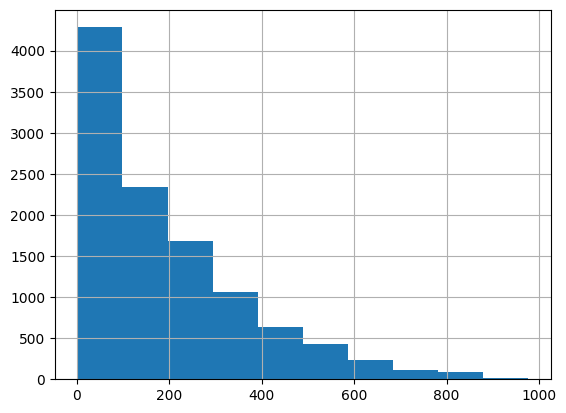

In [21]:
# DataFrame의 hist()를 이용해 자전거 대여 모델의 Target 값인 count 칼럼이 정규 분포를 이루는 지 확인
y_target.hist()

* count 칼럼 값이 정규 분포가 아닌 0~20 사이에 왜곡돼 있음 --> 로그 변환 적용

<Axes: >

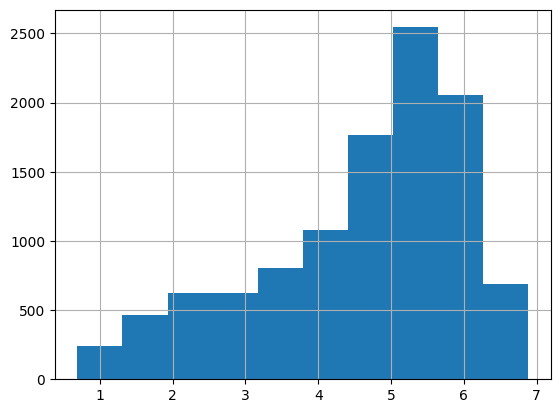

In [22]:
y_log_transform = np.log1p(y_target)
y_log_transform.hist()

* 로그 변환후에 원하는 정규 분포 형태는 아니지만 변환하기 전보다는 왜곡 정도가 많이 향상

In [23]:
# 타겟 컬럼인 count 값을 log1p 로 Log 변환
y_target_log = np.log1p(y_target)

# 로그 변환된 y_target_log를 반영하여 학습/테스트 데이터 셋 분할
X_train, X_test, y_train, y_test = train_test_split(X_features, y_target_log, test_size=0.3, random_state=0)
lr_reg = LinearRegression()
lr_reg.fit(X_train, y_train)
pred = lr_reg.predict(X_test)

# 테스트 데이터 셋의 Target 값은 Log 변환되었으므로 다시 expm1를 이용하여 원래 scale로 변환
y_test_exp = np.expm1(y_test)

# 예측 값 역시 Log 변환된 타겟 기반으로 학습되어 예측되었으므로 다시 exmpl으로 scale변환
pred_exp = np.expm1(pred)

evaluate_regr(y_test_exp ,pred_exp)


RMSLE: 1.017, RMSE: 162.594, MAE: 109.286


* RMSLE 오류는 줄어들었지만, RMSE는 오히려 더 늘어났음

<Axes: ylabel='None'>

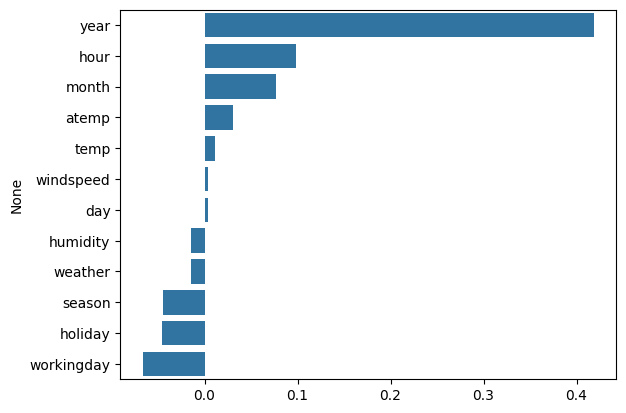

In [24]:
# 개별 피처들의 인코딩을 적용하기 전 각 피처의 회귀 계숫값을 시각화
coef = pd.Series(lr_reg.coef_, index=X_features.columns)
coef_sort = coef.sort_values(ascending=False)
sns.barplot(x=coef_sort.values, y=coef_sort.index)

* 'year', 'hour', 'month', 'season', 'holiday', 'workingday' 피처들의 회귀 계수 영향도가 상대적으로 높음
  * 'year', 'hour', 'month' 등은 숫자 값으로 표현되었지만 모두 카테고리형 피처
  * get_dummies()를 이용해 원-핫 인코딩(One Hot Encoding)한 후 다시 예측 성능 확인

In [25]:
# 'year', month', 'day', hour'등의 피처들을 One Hot Encoding
X_features_ohe = pd.get_dummies(X_features, columns=['year', 'month','day', 'hour', 'holiday',
                                              'workingday','season','weather'])



In [26]:
# 원-핫 인코딩이 적용된 feature 데이터 세트 기반으로 학습/예측 데이터 분할.
X_train, X_test, y_train, y_test = train_test_split(X_features_ohe, y_target_log,
                                                    test_size=0.3, random_state=0)

# 모델과 학습/테스트 데이터 셋을 입력하면 성능 평가 수치를 반환
def get_model_predict(model, X_train, X_test, y_train, y_test, is_expm1=False):
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    if is_expm1 :
        y_test = np.expm1(y_test)
        pred = np.expm1(pred)
    print('###',model.__class__.__name__,'###')
    evaluate_regr(y_test, pred)
# end of function get_model_predict

# model 별로 평가 수행
lr_reg = LinearRegression()
ridge_reg = Ridge(alpha=10)
lasso_reg = Lasso(alpha=0.01)

for model in [lr_reg, ridge_reg, lasso_reg]:
    get_model_predict(model,X_train, X_test, y_train, y_test,is_expm1=True)


### LinearRegression ###
RMSLE: 0.590, RMSE: 97.688, MAE: 63.382
### Ridge ###
RMSLE: 0.590, RMSE: 98.529, MAE: 63.893
### Lasso ###
RMSLE: 0.635, RMSE: 113.219, MAE: 72.803


* 원-핫 인코딩을 적용하고 나서 선형 회귀의 예측 성능이 많이 향상
  * 원-핫 인코딩으로 피처가 늘어났으므로 회귀 계수 상위 20개 피처를 추출

<Axes: ylabel='None'>

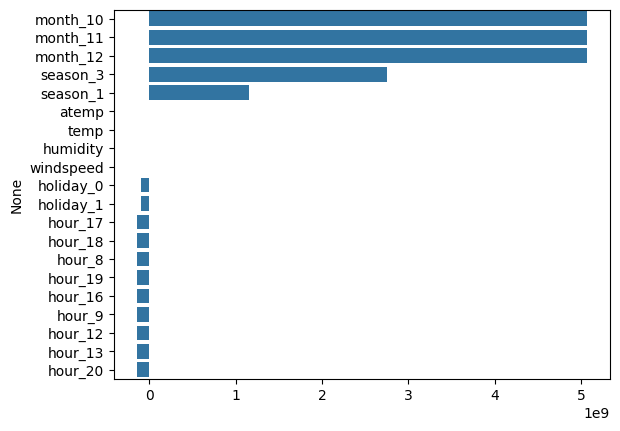

In [27]:
coef = pd.Series(lr_reg.coef_ , index=X_features_ohe.columns)
coef_sort = coef.sort_values(ascending=False)[:20]
sns.barplot(x=coef_sort.values , y=coef_sort.index)


* => 월, 주말/주중, 시간대 등 자전거를 타는데 필요하다고 생각되는 것들 위주로 피처 회귀 계수가 높아짐

∴선형 회귀 수행 시에는 피처를 어떻게 인코딩하는가가 성능에 큰 영향 미침

In [28]:
# Target 값의 로그 변환된 값과 원-핫 인코딩된 피처 데이터 세트를 이용해 GBM, XGBoost, LightGBM을 순차적으로 성능 평가
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

# 랜덤 포레스트, GBM, XGBoost, LightGBM model 별로 평가 수행
rf_reg = RandomForestRegressor(n_estimators=500)
gbm_reg = GradientBoostingRegressor(n_estimators=500)
xgb_reg = XGBRegressor(n_estimators=500)
lgbm_reg = LGBMRegressor(n_estimators=500)

for model in [rf_reg, gbm_reg, xgb_reg, lgbm_reg]:
    # XGBoost의 경우 DataFrame이 입력 될 경우 버전에 따라 오류 발생 가능. ndarray로 변환.
    get_model_predict(model,X_train.values, X_test.values, y_train.values, y_test.values,is_expm1=True)

### RandomForestRegressor ###
RMSLE: 0.355, RMSE: 50.256, MAE: 31.147
### GradientBoostingRegressor ###
RMSLE: 0.330, RMSE: 53.344, MAE: 32.746
### XGBRegressor ###
RMSLE: 0.339, RMSE: 51.475, MAE: 31.357
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 348
[LightGBM] [Info] Number of data points in the train set: 7620, number of used features: 72
[LightGBM] [Info] Start training from score 4.582043
### LGBMRegressor ###
RMSLE: 0.319, RMSE: 47.215, MAE: 29.029


* 선형회귀 모델보다 회귀 예측 성능이 개선됨
* but, 데이터 세트의 유형에 따라 결과가 달라질 수 있으므로 회귀 트리가 무조건 더 나은 성능을 가지는 것은 아님


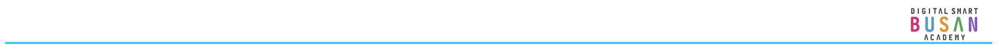

## 5.10 회귀 실습 - 캐글 주택 가격: 고급 회귀 기법
* 데이터 세트 다운로드 https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data


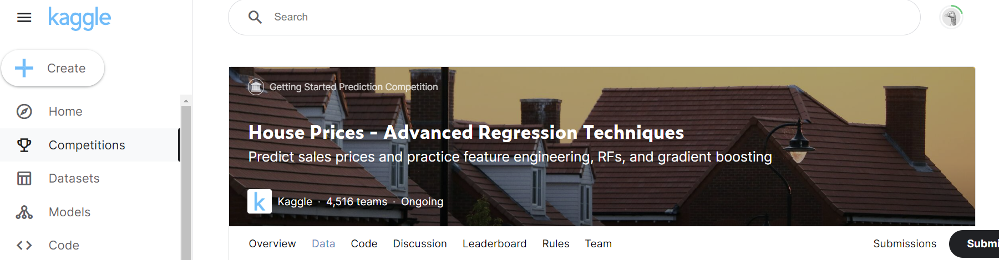

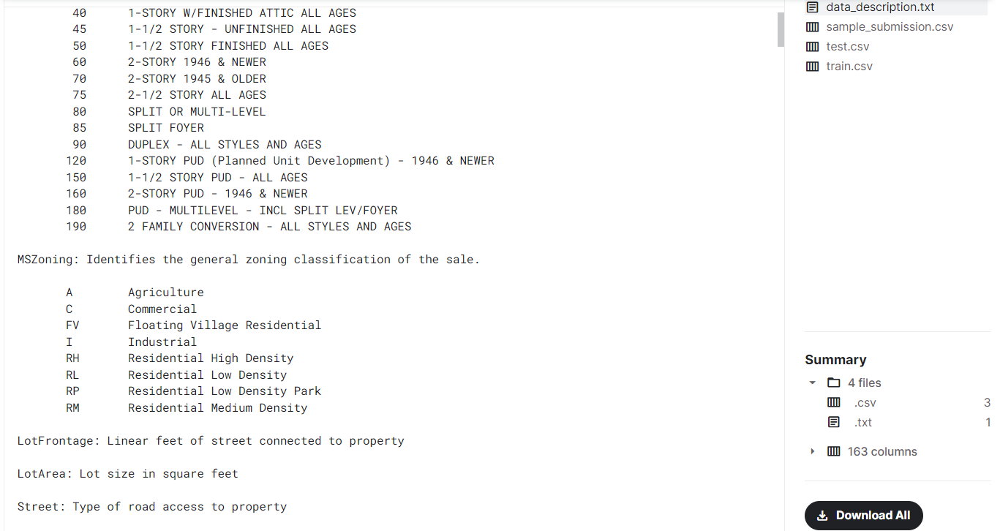

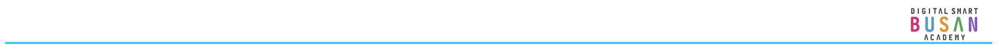

### 데이터 사전 처리(Preprocessing)

In [29]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

house_df_org = pd.read_csv('house_price.csv')
house_df = house_df_org.copy()
house_df.head(3)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


In [30]:
print('데이터 세트의 Shape:', house_df.shape)
print('\n전체 feature 들의 type \n',house_df.dtypes.value_counts())
isnull_series = house_df.isnull().sum()
print('\nNull 컬럼과 그 건수:\n ', isnull_series[isnull_series > 0].sort_values(ascending=False))

데이터 세트의 Shape: (1460, 81)

전체 feature 들의 type 
 object     43
int64      35
float64     3
Name: count, dtype: int64

Null 컬럼과 그 건수:
  PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
MasVnrType       872
FireplaceQu      690
LotFrontage      259
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtFinType2      38
BsmtExposure      38
BsmtFinType1      37
BsmtCond          37
BsmtQual          37
MasVnrArea         8
Electrical         1
dtype: int64


<Axes: title={'center': 'Original Sale Price Histogram'}, xlabel='SalePrice', ylabel='Density'>

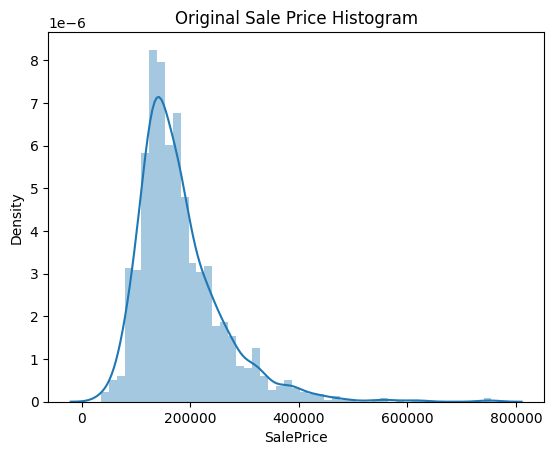

In [31]:
# 타깃 값의 분포도가 정규분포인지 확인(왼쪽으로 치우친 형태로 정규분포에서 벗어남)
plt.title('Original Sale Price Histogram')
sns.distplot(house_df['SalePrice'])

* => 데이터 분포가 왼쪽으로 약간 치우쳐진 상태이므로 정규분포 형태로 변환하기 위해 로그 변환을 적용함(로그 변환한 결괏값을 기반으로 학습한 뒤, 예측 시에는 결괏값을 원래대로 바꿈)


<Axes: title={'center': 'Log Transformed Sale Price Histogram'}, xlabel='SalePrice', ylabel='Density'>

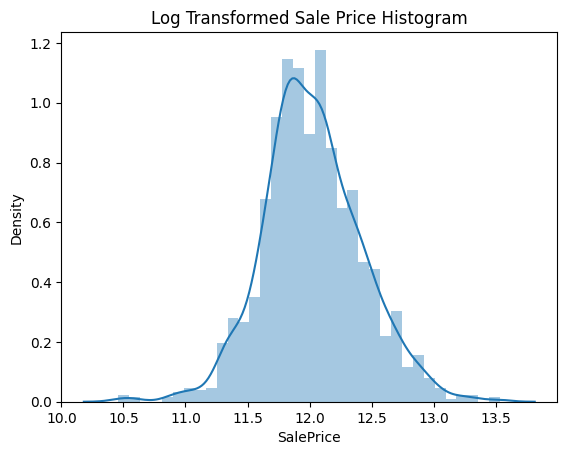

In [32]:
# SalePrice 로그 변환 적용 --> 정규 분포 형태
plt.title('Log Transformed Sale Price Histogram')
log_SalePrice = np.log1p(house_df['SalePrice'])
sns.distplot(log_SalePrice)

* 로그 변환 시 정규분포가 됨을 확인했으므로 데이터프레임에 반영


In [33]:
# SalePrice 로그 변환
original_SalePrice = house_df['SalePrice']
house_df['SalePrice'] = np.log1p(house_df['SalePrice'])

# Check if columns exist before dropping
columns_to_drop = ['Id','PoolQC' , 'MiscFeature', 'Alley', 'Fence','FireplaceQu']
existing_columns = [col for col in columns_to_drop if col in house_df.columns]

# Null 이 너무 많은 컬럼들과 불필요한 컬럼 삭제
if existing_columns:
    house_df.drop(existing_columns, axis=1 , inplace=True)
    print("Dropped columns:", existing_columns)
else:
    print("None of the specified columns exist in the DataFrame.")

# 숫자형 컬럼만 선택하여 평균 계산
numeric_columns = house_df.select_dtypes(include=['number'])
# Drop 하지 않는 숫자형 Null컬럼들은 평균값으로 대체
house_df[numeric_columns.columns] = numeric_columns.fillna(numeric_columns.mean())

# Null 값이 있는 피처명과 타입을 추출 (변경 후 확인)
null_column_count = house_df.isnull().sum()[house_df.isnull().sum() > 0]
print('## Null 피처의 Type :\n', house_df.dtypes[null_column_count.index])

Dropped columns: ['Id', 'PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu']
## Null 피처의 Type :
 MasVnrType      object
BsmtQual        object
BsmtCond        object
BsmtExposure    object
BsmtFinType1    object
BsmtFinType2    object
Electrical      object
GarageType      object
GarageFinish    object
GarageQual      object
GarageCond      object
dtype: object


In [34]:
# 문자형 피처 원-핫 인코딩으로 변환 --> Null 값은 모든 인코딩 값이 0으로 변환되는 방식으로 대체
print('get_dummies() 수행 전 데이터 Shape:', house_df.shape)
house_df_ohe = pd.get_dummies(house_df)
print('get_dummies() 수행 후 데이터 Shape:', house_df_ohe.shape)

null_column_count = house_df_ohe.isnull().sum()[house_df_ohe.isnull().sum() > 0]
print('## Null 피처의 Type :\n', house_df_ohe.dtypes[null_column_count.index])

# get_dummies() 수행 전 데이터 Shape: (1460, 75)
# get_dummies() 수행 후 데이터 Shape: (1460, 271)
# ## Null 피처의 Type :
# Series([], dtype: object)

get_dummies() 수행 전 데이터 Shape: (1460, 75)
get_dummies() 수행 후 데이터 Shape: (1460, 270)
## Null 피처의 Type :
 Series([], dtype: object)


* 원-핫 인코딩(get_dummies() 이용) 후 피처가 75개에서 270개로 증가

### 선형 회귀 모델의 학습/예측/평가

In [35]:
def get_rmse(model):
    pred = model.predict(X_test)
    mse = mean_squared_error(y_test , pred)
    rmse = np.sqrt(mse)
    print('{0} 로그 변환된 RMSE: {1}'.format(model.__class__.__name__,np.round(rmse, 3)))
    return rmse

def get_rmses(models):
    rmses = [ ]
    for model in models:
        rmse = get_rmse(model)
        rmses.append(rmse)
    return rmses

In [36]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

y_target = house_df_ohe['SalePrice']
X_features = house_df_ohe.drop('SalePrice',axis=1, inplace=False)

X_train, X_test, y_train, y_test = train_test_split(X_features, y_target, test_size=0.2, random_state=156)

# LinearRegression, Ridge, Lasso 학습, 예측, 평가
lr_reg = LinearRegression()
lr_reg.fit(X_train, y_train)

ridge_reg = Ridge()
ridge_reg.fit(X_train, y_train)

lasso_reg = Lasso()
lasso_reg.fit(X_train, y_train)

models = [lr_reg, ridge_reg, lasso_reg]
get_rmses(models)

# LinearRegression 로그 변환된 RMSE: 0.132
# Ridge 로그 변환된 RMSE: 0.128
# Lasso 로그 변환된 RMSE: 0.176
# [0.131895765791542, 0.12750846334053026, 0.17628250556471395]

LinearRegression 로그 변환된 RMSE: 0.132
Ridge 로그 변환된 RMSE: 0.127
Lasso 로그 변환된 RMSE: 0.176


[0.13183184688250854, 0.1274058283626615, 0.17628250556471403]

* 라쏘 회귀의 경우 회귀 성능이 타 회귀 방식보다 많이 떨어지는 결과가 나옴(RMSE가 높은 편일수록 상대적으로 회귀 성능이 떨어진다)
  * 라쏘의 경우 최적 하이퍼 파라미터 튜닝이 필요

In [37]:
# 회귀 계수값의 상위 10개, 하위 10개의 피처명과 그 회귀 계수 값을 가지는 판다스 시리즈 객체를 반환하는 함수 생성
def get_top_bottom_coef(model):
    # coef_ 속성을 기반으로 Series 객체를 생성. index는 컬럼명.
    coef = pd.Series(model.coef_, index=X_features.columns)

    # + 상위 10개 , - 하위 10개 coefficient 추출하여 반환.
    coef_high = coef.sort_values(ascending=False).head(10)
    coef_low = coef.sort_values(ascending=False).tail(10)
    return coef_high, coef_low


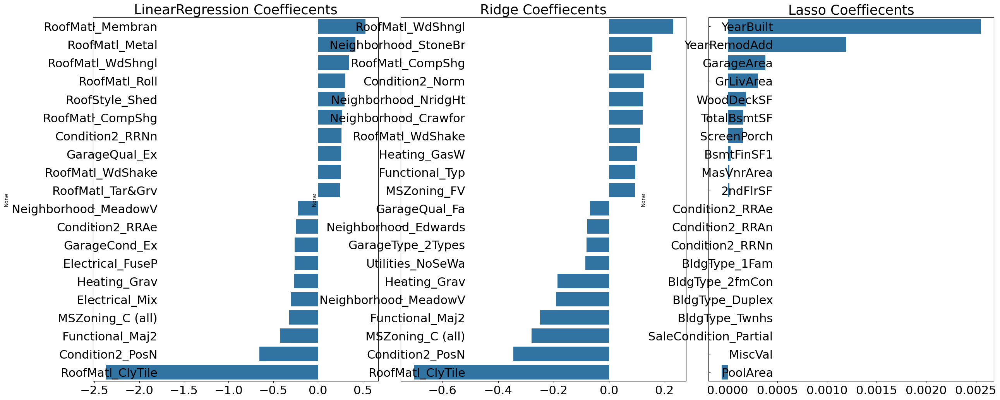

In [38]:
# 회귀 계수 상위 10개, 하위 10개를 추출해 가로 막대 그래프 형태로 출력
def visualize_coefficient(models):
    # 3개 회귀 모델의 시각화를 위해 3개의 컬럼을 가지는 subplot 생성
    fig, axs = plt.subplots(figsize=(24,10),nrows=1, ncols=3)
    fig.tight_layout()
    # 입력인자로 받은 list객체인 models에서 차례로 model을 추출하여 회귀 계수 시각화.
    for i_num, model in enumerate(models):
        # 상위 10개, 하위 10개 회귀 계수를 구하고, 이를 판다스 concat으로 결합.
        coef_high, coef_low = get_top_bottom_coef(model)
        coef_concat = pd.concat( [coef_high , coef_low] )
        # 순차적으로 ax subplot에 barchar로 표현. 한 화면에 표현하기 위해 tick label 위치와 font 크기 조정.
        axs[i_num].set_title(model.__class__.__name__+' Coeffiecents', size=25)
        axs[i_num].tick_params(axis="y",direction="in", pad=-120)
        for label in (axs[i_num].get_xticklabels() + axs[i_num].get_yticklabels()):
            label.set_fontsize(22)
        sns.barplot(x=coef_concat.values, y=coef_concat.index , ax=axs[i_num])

# 앞 예제에서 학습한 lr_reg, ridge_reg, lasso_reg 모델의 회귀 계수 시각화.
models = [lr_reg, ridge_reg, lasso_reg]
visualize_coefficient(models)


* 모델별 회귀 계수를 보면 OLS 기반의 LinearRegression과 Ridge의 경우는 회귀 계수가 유사한 형태로 분포
  * 라쏘는 전체적으로 회귀 계수 값이 매우 작고, 그중 YearBuilt가 가장 크고 다른 피처의 회귀 계수는 너무 작음

In [39]:
# 학습 데이터의 분할 문제인지 확인하기 위해 학습과 테스트 데이터 세트를 교차 검증을 이용해 분할하여 RMSE를 측정
from sklearn.model_selection import cross_val_score

def get_avg_rmse_cv(models):
    for model in models:
        # 분할하지 않고 전체 데이터로 cross_val_score( ) 수행. 모델별 CV RMSE값과 평균 RMSE 출력
        rmse_list = np.sqrt(-cross_val_score(model, X_features, y_target,
                                             scoring="neg_mean_squared_error", cv = 5))
        rmse_avg = np.mean(rmse_list)
        print('\n{0} CV RMSE 값 리스트: {1}'.format( model.__class__.__name__, np.round(rmse_list, 3)))
        print('{0} CV 평균 RMSE 값: {1}'.format( model.__class__.__name__, np.round(rmse_avg, 3)))

# 앞 예제에서 학습한 lr_reg, ridge_reg, lasso_reg 모델의 CV RMSE값 출력
models = [lr_reg, ridge_reg, lasso_reg]
get_avg_rmse_cv(models)


LinearRegression CV RMSE 값 리스트: [0.135 0.165 0.167 0.111 0.198]
LinearRegression CV 평균 RMSE 값: 0.155

Ridge CV RMSE 값 리스트: [0.117 0.154 0.142 0.117 0.189]
Ridge CV 평균 RMSE 값: 0.144

Lasso CV RMSE 값 리스트: [0.161 0.204 0.177 0.181 0.265]
Lasso CV 평균 RMSE 값: 0.198


* 5개의 폴드 세트로 학습한 후 평가 여전히 라쏘의 경우 릿지 모델보다 성능이 떨어짐

* 하이퍼 파라미터 튜닝

In [40]:
# 릿지 모델과 라쏘 모델의 최적화 alpha 값을 추출
from sklearn.model_selection import GridSearchCV

def print_best_params(model, params):
    grid_model = GridSearchCV(model, param_grid=params,
                              scoring='neg_mean_squared_error', cv=5)
    grid_model.fit(X_features, y_target)
    rmse = np.sqrt(-1* grid_model.best_score_)
    print('{0} 5 CV 시 최적 평균 RMSE 값: {1}, 최적 alpha:{2}'.format(model.__class__.__name__,
                                        np.round(rmse, 4), grid_model.best_params_))
    return grid_model.best_estimator_

ridge_params = { 'alpha':[0.05, 0.1, 1, 5, 8, 10, 12, 15, 20] }
lasso_params = { 'alpha':[0.001, 0.005, 0.008, 0.05, 0.03, 0.1, 0.5, 1,5, 10] }
best_rige = print_best_params(ridge_reg, ridge_params)
best_lasso = print_best_params(lasso_reg, lasso_params)


Ridge 5 CV 시 최적 평균 RMSE 값: 0.1418, 최적 alpha:{'alpha': 12}
Lasso 5 CV 시 최적 평균 RMSE 값: 0.142, 최적 alpha:{'alpha': 0.001}


* 릿지 모델의 경우 alpha가 12에서 최적 평균 RMSE가 0.148, 라쏘 모델의 경우 alpha가 0.001에서 최적 평균 RMSE가 0.142
  * 라쏘 모델의 경우 alpha 값 최적화 이후 예측 성능이 많이 좋아빔

LinearRegression 로그 변환된 RMSE: 0.132
Ridge 로그 변환된 RMSE: 0.124
Lasso 로그 변환된 RMSE: 0.12


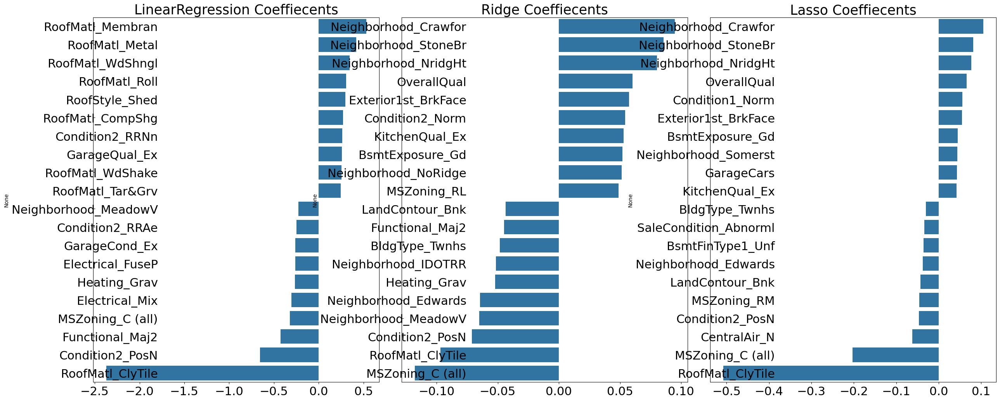

In [41]:
# 앞의 최적화 alpha값으로 학습데이터로 학습, 테스트 데이터로 예측 및 평가 수행.
lr_reg = LinearRegression()
lr_reg.fit(X_train, y_train)
ridge_reg = Ridge(alpha=12)
ridge_reg.fit(X_train, y_train)
lasso_reg = Lasso(alpha=0.001)
lasso_reg.fit(X_train, y_train)

# 모든 모델의 RMSE 출력
models = [lr_reg, ridge_reg, lasso_reg]
get_rmses(models)

# 모든 모델의 회귀 계수 시각화
models = [lr_reg, ridge_reg, lasso_reg]
visualize_coefficient(models)

* 최적화 후 테스트 데이터 세트의 예측 성능이 더 좋아졌음을 알 수 있다
* 릿지와 라쏘 모델에서 비슷한 피처의 회귀 계수 높으나 동일한 피처라도 라쏘가 릿지에 비해 회귀 계수의 값이 상당히 작다.

* 데이터 왜곡 로그 변환 후 성능 평가

In [42]:
from scipy.stats import skew

# object가 아닌 숫자형 피쳐의 컬럼 index 객체 추출.
features_index = house_df.dtypes[house_df.dtypes != 'object'].index
# house_df에 컬럼 index를 [ ]로 입력하면 해당하는 컬럼 데이터 셋 반환. apply lambda로 skew( )호출
skew_features = house_df[features_index].apply(lambda x : skew(x))
# skew 정도가 1 이상인 컬럼들만 추출.
skew_features_top = skew_features[skew_features > 1]
print(skew_features_top.sort_values(ascending=False))

MiscVal          24.451640
PoolArea         14.813135
LotArea          12.195142
3SsnPorch        10.293752
LowQualFinSF      9.002080
KitchenAbvGr      4.483784
BsmtFinSF2        4.250888
ScreenPorch       4.117977
BsmtHalfBath      4.099186
EnclosedPorch     3.086696
MasVnrArea        2.673661
LotFrontage       2.382499
OpenPorchSF       2.361912
BsmtFinSF1        1.683771
WoodDeckSF        1.539792
TotalBsmtSF       1.522688
MSSubClass        1.406210
1stFlrSF          1.375342
GrLivArea         1.365156
dtype: float64


In [43]:
# 추출 왜곡 정도가 높은 피처를 로그 변환
house_df[skew_features_top.index] = np.log1p(house_df[skew_features_top.index])

In [44]:
# Skew가 높은 피처들을 로그 변환 했으므로 다시 원-핫 인코딩 적용 및 피처/타겟 데이터 셋 생성,
house_df_ohe = pd.get_dummies(house_df)
y_target = house_df_ohe['SalePrice']
X_features = house_df_ohe.drop('SalePrice',axis=1, inplace=False)
X_train, X_test, y_train, y_test = train_test_split(X_features, y_target, test_size=0.2, random_state=156)

# 피처들을 로그 변환 후 다시 최적 하이퍼 파라미터와 RMSE 출력
ridge_params = { 'alpha':[0.05, 0.1, 1, 5, 8, 10, 12, 15, 20] }
lasso_params = { 'alpha':[0.001, 0.005, 0.008, 0.05, 0.03, 0.1, 0.5, 1,5, 10] }
best_ridge = print_best_params(ridge_reg, ridge_params)
best_lasso = print_best_params(lasso_reg, lasso_params)

Ridge 5 CV 시 최적 평균 RMSE 값: 0.1275, 최적 alpha:{'alpha': 10}
Lasso 5 CV 시 최적 평균 RMSE 값: 0.1252, 최적 alpha:{'alpha': 0.001}


LinearRegression 로그 변환된 RMSE: 0.128
Ridge 로그 변환된 RMSE: 0.122
Lasso 로그 변환된 RMSE: 0.119


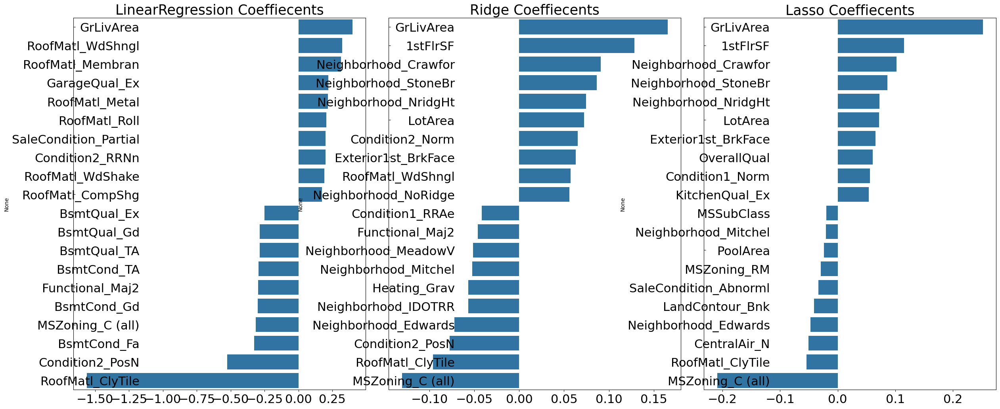

In [45]:
# 앞의 최적화 alpha값으로 학습데이터로 학습, 테스트 데이터로 예측 및 평가 수행.
lr_reg = LinearRegression()
lr_reg.fit(X_train, y_train)
ridge_reg = Ridge(alpha=10)
ridge_reg.fit(X_train, y_train)
lasso_reg = Lasso(alpha=0.001)
lasso_reg.fit(X_train, y_train)

# 모든 모델의 RMSE 출력
models = [lr_reg, ridge_reg, lasso_reg]
get_rmses(models)

# 모든 모델의 회귀 계수 시각화
models = [lr_reg, ridge_reg, lasso_reg]
visualize_coefficient(models)

* 릿지 모델의 경우 최적 alpha값이 12에서 10으로 변경
* 두 모델 모두 피처의 로그 변환 이전과 비교해 5 폴드 교차 검증의 평균 RMSE 값(릿지: 0.1418 --> 0.1275, 라쏘: 0.142 --> 0.1252)이 향상
* 시각화 결과 세 모델 모두 GrLivArea, 즉 주거 공간 크기가 회귀 계수가 가장 높은 피처

* 이상치 제거

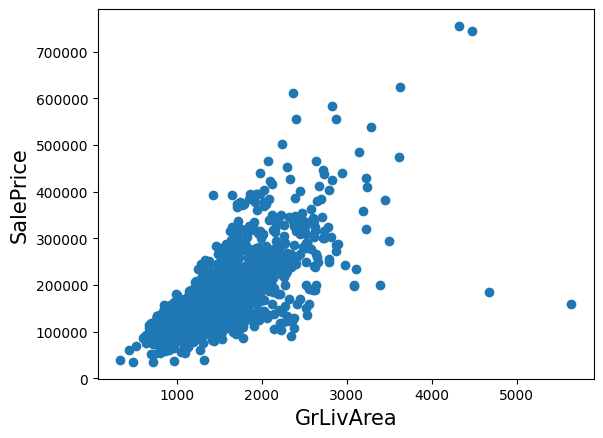

In [46]:
plt.scatter(x = house_df_org['GrLivArea'], y = house_df_org['SalePrice'])
plt.ylabel('SalePrice', fontsize=15)
plt.xlabel('GrLivArea', fontsize=15)
plt.show()


* 주거 공간이 큰 집일수록 가격이 비싸기 때문에 양의 상관도가 매우 높음
  * 그래프 우측 하단 2개의 이상치
  * GrLivArea가 4000평방피트 이상임에도 가격이 500,00달러 이하인데이터는 노두 이상치로 간주하고 삭제

In [47]:
# GrLivArea와 SalePrice 모두 로그 변환되었으므로 이를 반영한 조건 생성.
cond1 = house_df_ohe['GrLivArea'] > np.log1p(4000)
cond2 = house_df_ohe['SalePrice'] < np.log1p(500000)
outlier_index = house_df_ohe[cond1 & cond2].index

print('아웃라이어 레코드 index :', outlier_index.values)
print('아웃라이어 삭제 전 house_df_ohe shape:', house_df_ohe.shape)
# DataFrame의 index를 이용하여 아웃라이어 레코드 삭제.
house_df_ohe.drop(outlier_index , axis=0, inplace=True)
print('아웃라이어 삭제 후 house_df_ohe shape:', house_df_ohe.shape)

아웃라이어 레코드 index : [ 523 1298]
아웃라이어 삭제 전 house_df_ohe shape: (1460, 270)
아웃라이어 삭제 후 house_df_ohe shape: (1458, 270)


In [48]:
# 업데이트된 데이터를 기반으로 피처 데이터 세트와 타깃 데이터 세트를 다시 생성하고 모델의 최적화 수행
y_target = house_df_ohe['SalePrice']
X_features = house_df_ohe.drop('SalePrice',axis=1, inplace=False)
X_train, X_test, y_train, y_test = train_test_split(X_features, y_target, test_size=0.2, random_state=156)

ridge_params = { 'alpha':[0.05, 0.1, 1, 5, 8, 10, 12, 15, 20] }
lasso_params = { 'alpha':[0.001, 0.005, 0.008, 0.05, 0.03, 0.1, 0.5, 1,5, 10] }
best_ridge = print_best_params(ridge_reg, ridge_params)
best_lasso = print_best_params(lasso_reg, lasso_params)

Ridge 5 CV 시 최적 평균 RMSE 값: 0.1125, 최적 alpha:{'alpha': 8}
Lasso 5 CV 시 최적 평균 RMSE 값: 0.1122, 최적 alpha:{'alpha': 0.001}


* 두 개의 이상치 데이터만 제거했는데 예측 수치가 매우 크게 향상
  * 릿지 경우: 최적 alpha 값은 12에서 8, 평균 RMSE가 0.1275에서 0.1125로 개선
  * 라쏘 경우: 평균 RMSE가 0.1252에서 0.1122로 개선

LinearRegression 로그 변환된 RMSE: 0.129
Ridge 로그 변환된 RMSE: 0.103
Lasso 로그 변환된 RMSE: 0.1


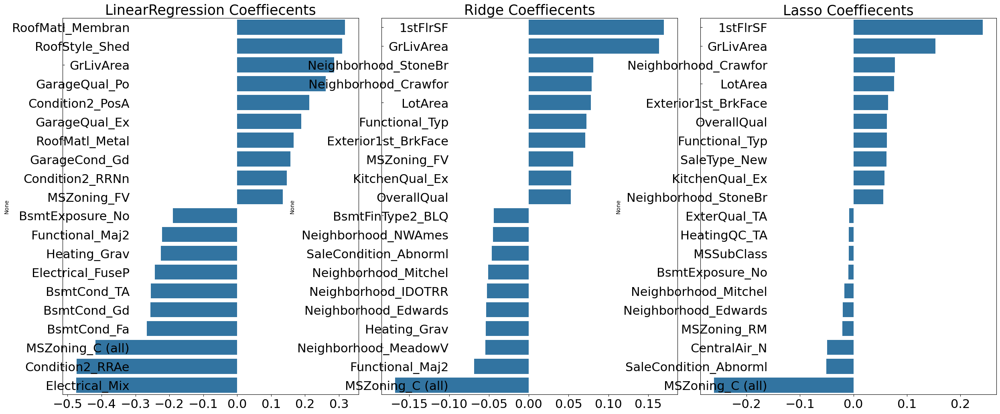

In [49]:
# 앞의 최적화 alpha값으로 학습데이터로 학습, 테스트 데이터로 예측 및 평가 수행.
lr_reg = LinearRegression()
lr_reg.fit(X_train, y_train)
ridge_reg = Ridge(alpha=8)
ridge_reg.fit(X_train, y_train)
lasso_reg = Lasso(alpha=0.001)
lasso_reg.fit(X_train, y_train)

# 모든 모델의 RMSE 출력
models = [lr_reg, ridge_reg, lasso_reg]
get_rmses(models)

# 모든 모델의 회귀 계수 시각화
models = [lr_reg, ridge_reg, lasso_reg]
visualize_coefficient(models)

### 회귀 트리 학습/예측/평가
* XGboost는 XGBRegressor 클래스를 LightGBM는 LGBMRegressor 클래스를 이용

In [50]:
from xgboost import XGBRegressor

xgb_params = {'n_estimators':[1000]}
xgb_reg = XGBRegressor(n_estimators=1000, learning_rate=0.05,
                       colsample_bytree=0.5, subsample=0.8)
best_xgb = print_best_params(xgb_reg, xgb_params)

XGBRegressor 5 CV 시 최적 평균 RMSE 값: 0.1185, 최적 alpha:{'n_estimators': 1000}


* XGboost 회귀 트리를 적용: 5폴드 세트 평균 RMSE각 0.1182

In [51]:
from lightgbm import LGBMRegressor

lgbm_params = {'n_estimators':[1000]}
lgbm_reg = LGBMRegressor(n_estimators=1000, learning_rate=0.05, num_leaves=4,
                         subsample=0.6, colsample_bytree=0.4, reg_lambda=10, n_jobs=-1)
best_lgbm = print_best_params(lgbm_reg, lgbm_params)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3155
[LightGBM] [Info] Number of data points in the train set: 1166, number of used features: 171
[LightGBM] [Info] Start training from score 12.021352
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3167
[LightGBM] [Info] Number of data points in the train set: 1166, number of used features: 168
[LightGBM] [Info] Start training from score 12.023516
[LightGBM] [Warning] Found

* LightGBM 회귀 트리를 적용: 5폴드 세트 평균 RMSE각 0.1163

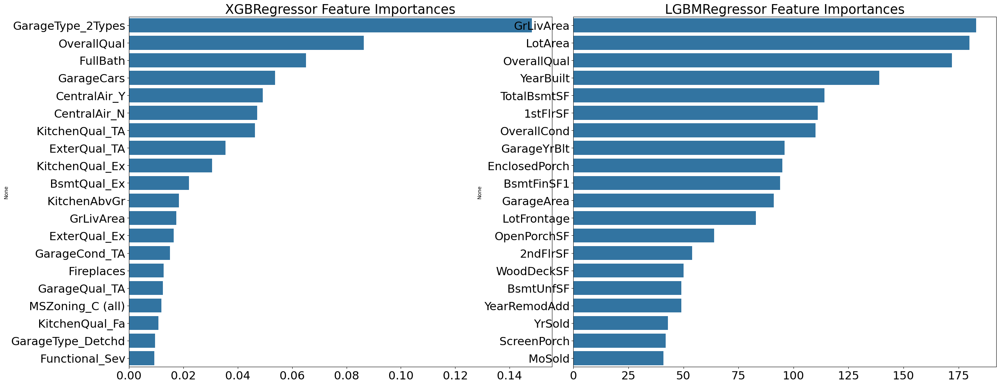

In [52]:
# 피처 중요도 시각화(모델의 중요도 상위 20개의 피처명과 그때의 중요도값을 Series로 반환)
def get_top_features(model):
    ftr_importances_values = model.feature_importances_
    ftr_importances = pd.Series(ftr_importances_values, index=X_features.columns  )
    ftr_top20 = ftr_importances.sort_values(ascending=False)[:20]
    return ftr_top20

def visualize_ftr_importances(models):
    # 2개 회귀 모델의 시각화를 위해 2개의 컬럼을 가지는 subplot 생성
    fig, axs = plt.subplots(figsize=(24,10),nrows=1, ncols=2)
    fig.tight_layout()
    # 입력인자로 받은 list객체인 models에서 차례로 model을 추출하여 피처 중요도 시각화.
    for i_num, model in enumerate(models):
        # 중요도 상위 20개의 피처명과 그때의 중요도값 추출
        ftr_top20 = get_top_features(model)
        axs[i_num].set_title(model.__class__.__name__+' Feature Importances', size=25)
        #font 크기 조정.
        for label in (axs[i_num].get_xticklabels() + axs[i_num].get_yticklabels()):
            label.set_fontsize(22)
        sns.barplot(x=ftr_top20.values, y=ftr_top20.index , ax=axs[i_num])

# 앞 예제에서 print_best_params( )가 반환한 GridSearchCV로 최적화된 모델의 피처 중요도 시각화
models = [best_xgb, best_lgbm]
visualize_ftr_importances(models)


### 회귀 모델들의 예측 결과 혼합을 통한 최종 예측

In [53]:
# 릿지 모델 예측값의 40%, 라쏘 모델 예측값의 60%를 더해서 최종 회귀값으로 예측
def get_rmse_pred(preds):
    for key in preds.keys():
        pred_value = preds[key]
        mse = mean_squared_error(y_test , pred_value)
        rmse = np.sqrt(mse)
        print('{0} 모델의 RMSE: {1}'.format(key, rmse))

# 개별 모델의 학습
ridge_reg = Ridge(alpha=8)
ridge_reg.fit(X_train, y_train)
lasso_reg = Lasso(alpha=0.001)
lasso_reg.fit(X_train, y_train)
# 개별 모델 예측
ridge_pred = ridge_reg.predict(X_test)
lasso_pred = lasso_reg.predict(X_test)

# 개별 모델 예측값 혼합으로 최종 예측값 도출
pred = 0.4 * ridge_pred + 0.6 * lasso_pred
preds = {'최종 혼합': pred,
         'Ridge': ridge_pred,
         'Lasso': lasso_pred}
#최종 혼합 모델, 개별모델의 RMSE 값 출력
get_rmse_pred(preds)


최종 혼합 모델의 RMSE: 0.10006075517615194
Ridge 모델의 RMSE: 0.10340697165289348
Lasso 모델의 RMSE: 0.10024171179335342


* 최종 혼합 모델 RMSE가 개별 모델보다 성능 면에서 약간 개선

In [54]:
# XGBoost와 LightGBM 혼합
xgb_reg = XGBRegressor(n_estimators=1000, learning_rate=0.05,
                       colsample_bytree=0.5, subsample=0.8)
lgbm_reg = LGBMRegressor(n_estimators=1000, learning_rate=0.05, num_leaves=4,
                         subsample=0.6, colsample_bytree=0.4, reg_lambda=10, n_jobs=-1)
xgb_reg.fit(X_train, y_train)
lgbm_reg.fit(X_train, y_train)
xgb_pred = xgb_reg.predict(X_test)
lgbm_pred = lgbm_reg.predict(X_test)

pred = 0.5 * xgb_pred + 0.5 * lgbm_pred
preds = {'최종 혼합': pred,
         'XGBM': xgb_pred,
         'LGBM': lgbm_pred}

get_rmse_pred(preds)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3174
[LightGBM] [Info] Number of data points in the train set: 1166, number of used features: 172
[LightGBM] [Info] Start training from score 12.025343
최종 혼합 모델의 RMSE: 0.10208933384486087
XGBM 모델의 RMSE: 0.10749463285555907
LGBM 모델의 RMSE: 0.10363891833477148


* XGBoost와 LightGBM의 혼합 모델의 RMSE가 개별 모델의 RMSE 보다 조금 향상

### 스태킹 모델을 통한 회귀 예측
* 최종 메타 모델이 학습할 피처 데이터 세트는 원본 학습 피처 세트로 학습한 개별 모델의 예측값을 스태킹 형태로 결합

In [55]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error

# 개별 기반 모델에서 최종 메타 모델이 사용할 학습 및 테스트용 데이터를 생성하기 위한 함수.

def get_stacking_base_datasets(model, X_train_n, y_train_n, X_test_n, n_folds ):
    # 지정된 n_folds값으로 KFold 생성.
    # 'shuffle'을 True로 설정하거나 'random_state'를 제거합니다.
    kf = KFold(n_splits=n_folds, shuffle=True, random_state=0)
    #추후에 메타 모델이 사용할 학습 데이터 반환을 위한 넘파이 배열 초기화
    train_fold_pred = np.zeros((X_train_n.shape[0] ,1 ))
    test_pred = np.zeros((X_test_n.shape[0],n_folds))
    print(model.__class__.__name__ , ' model 시작 ')

    for folder_counter , (train_index, valid_index) in enumerate(kf.split(X_train_n)):
        #입력된 학습 데이터에서 기반 모델이 학습/예측할 폴드 데이터 셋 추출
        print('\t 폴드 세트: ',folder_counter,' 시작 ')
        X_tr = X_train_n[train_index]
        y_tr = y_train_n[train_index]
        X_te = X_train_n[valid_index]

        #폴드 세트 내부에서 다시 만들어진 학습 데이터로 기반 모델의 학습 수행.
        model.fit(X_tr , y_tr)
        #폴드 세트 내부에서 다시 만들어진 검증 데이터로 기반 모델 예측 후 데이터 저장.
        train_fold_pred[valid_index, :] = model.predict(X_te).reshape(-1,1)
        #입력된 원본 테스트 데이터를 폴드 세트내 학습된 기반 모델에서 예측 후 데이터 저장.
        test_pred[:, folder_counter] = model.predict(X_test_n)

    # 폴드 세트 내에서 원본 테스트 데이터를 예측한 데이터를 평균하여 테스트 데이터로 생성
    test_pred_mean = np.mean(test_pred, axis=1).reshape(-1,1)

    #train_fold_pred는 최종 메타 모델이 사용하는 학습 데이터, test_pred_mean은 테스트 데이터
    return train_fold_pred , test_pred_mean

In [56]:
# get_stacking_base_datasets( )은 넘파이 ndarray를 인자로 사용하므로 DataFrame을 넘파이로 변환.
X_train_n = X_train.values
X_test_n = X_test.values
y_train_n = y_train.values

# 각 개별 기반(Base)모델이 생성한 학습용/테스트용 데이터 반환.
ridge_train, ridge_test = get_stacking_base_datasets(ridge_reg, X_train_n, y_train_n, X_test_n, 5)
lasso_train, lasso_test = get_stacking_base_datasets(lasso_reg, X_train_n, y_train_n, X_test_n, 5)
xgb_train, xgb_test = get_stacking_base_datasets(xgb_reg, X_train_n, y_train_n, X_test_n, 5)
lgbm_train, lgbm_test = get_stacking_base_datasets(lgbm_reg, X_train_n, y_train_n, X_test_n, 5)



Ridge  model 시작 
	 폴드 세트:  0  시작 
	 폴드 세트:  1  시작 
	 폴드 세트:  2  시작 
	 폴드 세트:  3  시작 
	 폴드 세트:  4  시작 
Lasso  model 시작 
	 폴드 세트:  0  시작 
	 폴드 세트:  1  시작 
	 폴드 세트:  2  시작 
	 폴드 세트:  3  시작 
	 폴드 세트:  4  시작 
XGBRegressor  model 시작 
	 폴드 세트:  0  시작 
	 폴드 세트:  1  시작 
	 폴드 세트:  2  시작 
	 폴드 세트:  3  시작 
	 폴드 세트:  4  시작 
LGBMRegressor  model 시작 
	 폴드 세트:  0  시작 
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2958
[LightGBM] [Info] Number of data points in the train set: 932, number of used features: 161
[LightGBM] [Info] Start training from score 12.021282
	 폴드 세트:  1  시작 
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=tru

In [57]:
# 개별 모델이 반환한 학습 및 테스트용 데이터 세트를 Stacking 형태로 결합.
Stack_final_X_train = np.concatenate((ridge_train, lasso_train,
                                      xgb_train, lgbm_train), axis=1)
Stack_final_X_test = np.concatenate((ridge_test, lasso_test,
                                     xgb_test, lgbm_test), axis=1)

# 최종 메타 모델은 라쏘 모델을 적용.
meta_model_lasso = Lasso(alpha=0.0005)

#기반 모델의 예측값을 기반으로 새롭게 만들어진 학습 및 테스트용 데이터로 예측하고 RMSE 측정.
meta_model_lasso.fit(Stack_final_X_train, y_train)
final = meta_model_lasso.predict(Stack_final_X_test)
mse = mean_squared_error(y_test , final)
rmse = np.sqrt(mse)
print('스태킹 회귀 모델의 최종 RMSE 값은:', rmse)

스태킹 회귀 모델의 최종 RMSE 값은: 0.09769989078638165


* 최종적으로 스태킹 회귀 모델을 적용 결과 테스트 데이터 세트에서 RMSE가 약 0.0979로 가장 좋은 성능

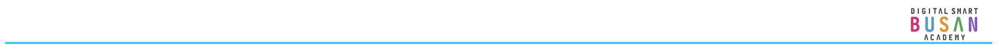